<h1 style="color:blue; font-size:45px; font-family:Arial, sans-serif; text-align:center;">CAR'S EX-SHOWROOM PRICE PREDICTION</h1>

<h1 style="color:red; font-size:36px; font-family:Arial, sans-serif; text-align:center;">INTRODUCTION</h1>


In today's fast-paced world, the automotive industry is undergoing rapid advancements with each passing day. The demand for cars is soaring, and consumers are presented with a myriad of options, ranging from different makes and models to various features and specifications. One of the critical factors that influence a buyer's decision is the ex-showroom price, which represents the cost of the vehicle before any additional charges like taxes, insurance, and registration fees.

# Project Objectives :

### <span style="color: #0099cc">1. Price Prediction</span>
The primary goal is to build a predictive model that can accurately estimate the ex-showroom price of a car based on various features such as make, model, specifications, and market demand.

### <span style="color: #0099cc">2. Data Analysis</span>
Analyze historical pricing data to identify key factors influencing car prices, including market trends, brand reputation, vehicle specifications, and more.
### <span style="color: #0099cc">3. Model Development</span>
Utilize machine learning algorithms to develop a robust pricing prediction model that can adapt to changing market conditions and provide real-time insights.
### <span style="color: #0099cc">4. Transparency</span>
Promote transparency in pricing by providing a tool that helps both car manufacturers and consumers understand the rationale behind price tags.
### <span style="color: #0099cc">Competitive Pricing</span>
Enable car manufacturers and dealerships to set competitive and customer-friendly prices, which can contribute to increased sales and profitability.






In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
sns.set(style="darkgrid",font_scale=1.2)
pd.set_option("display.max.columns",None)
pd.set_option("display.max.rows",None)
%matplotlib inline

from scipy import stats
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, StackingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor


from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split,cross_val_score, cross_val_predict, learning_curve
from sklearn.preprocessing import LabelEncoder,PowerTransformer
from sklearn.feature_selection import SelectKBest, f_regression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error,mean_squared_error,r2_score

In [2]:
car = pd.read_csv("C:/Users/Hp/Downloads/cpp/cars_engage_2022 (1).csv")
car

,Unnamed: 0,Make,Model,Variant,Ex-Showroom_Price,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_System,Fuel_Tank_Capacity,Fuel_Type,Height,Length,Width,Body_Type,Doors,City_Mileage,Highway_Mileage,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,0,Tata,Nano Genx,Xt,"Rs. 2,92,667",624 cc,2.0,2.0,RWD (Rear Wheel Drive),In-line,BS IV,"Rear, Transverse",Injection,24 litres,Petrol,1652 mm,3164 mm,1750 mm,Hatchback,5.0,?23.6 km/litre,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,Electric Power,Only Front Windows,NaN,Remote,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,Yes,Yes,CD Player with USB & Aux-in,Yes,Yes,2 years /75000 Kms (years/distance whichever c...,Yes,Internal,110 litres,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,2 years /150000 Kms (years/distance whichever ...,Yes,Internal,Digital,Manual,Analog + Digital,Yes,4 meter,Yes,Driver & Front Passenger,Not Applicable,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Tata,Nano Genx,Xe,"Rs. 2,36,447",624 cc,2.0,2.0,RWD (Rear Wheel Drive),In-line,BS IV,"Rear, Transverse",Injection,24 litres,Petrol,1652 mm,3164 mm,1750 mm,Hatchback,5.0,?23.6 km/litre,NaN,23.6 km/litre,NaN,725 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,NaN,NaN,NaN,NaN,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,NaN,Yes,Not on offer,NaN,Yes,2

In [3]:
car.head()

,Unnamed: 0,Make,Model,Variant,Ex-Showroom_Price,Displacement,Cylinders,Valves_Per_Cylinder,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_System,Fuel_Tank_Capacity,Fuel_Type,Height,Length,Width,Body_Type,Doors,City_Mileage,Highway_Mileage,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seating_Capacity,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Number_of_Airbags,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,USB_Ports,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
0,0,Tata,Nano Genx,Xt,"Rs. 2,92,667",624 cc,2.0,2.0,RWD (Rear Wheel Drive),In-line,BS IV,"Rear, Transverse",Injection,24 litres,Petrol,1652 mm,3164 mm,1750 mm,Hatchback,5.0,?23.6 km/litre,NaN,23.6 km/litre,NaN,660 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,Electric Power,Only Front Windows,NaN,Remote,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,Yes,Yes,CD Player with USB & Aux-in,Yes,Yes,2 years /75000 Kms (years/distance whichever c...,Yes,Internal,110 litres,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,2 years /150000 Kms (years/distance whichever ...,Yes,Internal,Digital,Manual,Analog + Digital,Yes,4 meter,Yes,Driver & Front Passenger,Not Applicable,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Tata,Nano Genx,Xe,"Rs. 2,36,447",624 cc,2.0,2.0,RWD (Rear Wheel Drive),In-line,BS IV,"Rear, Transverse",Injection,24 litres,Petrol,1652 mm,3164 mm,1750 mm,Hatchback,5.0,?23.6 km/litre,NaN,23.6 km/litre,NaN,725 kg,4,180 mm,Drum,Drum,"Independent, Lower Wishbone, McPherson Strut w...","Independent, Semi Trailing arm with coil sprin...",1325 mm,1315 mm,135/70R12,155/65R12,NaN,NaN,NaN,NaN,38PS@5500rpm,51Nm@4000rpm,Digital,Analog,Not on offer,Yes,4.0,Fabric,Manual,2230 mm,4 B X 12,NaN,Yes,Not on offer,NaN,Yes,2

In [4]:
car.shape

(1276, 141)

In [5]:
car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1276 entries, 0 to 1275
Columns: 141 entries, Unnamed: 0 to Electric_Range
dtypes: float64(6), int64(1), object(134)
memory usage: 1.4+ MB


In [6]:
car.select_dtypes(include="float").sample(5)

,Cylinders,Valves_Per_Cylinder,Doors,Seating_Capacity,Number_of_Airbags,USB_Ports
1089,4.0,4.0,4.0,5.0,2.0,NaN
1243,4.0,4.0,4.0,5.0,6.0,NaN
806,4.0,4.0,2.0,4.0,8.0,NaN
751,4.0,4.0,5.0,7.0,6.0,NaN
1061,3.0,4.0,5.0,5.0,2.0,NaN


In [7]:
car.select_dtypes(include="object").sample(5)

,Make,Model,Variant,Ex-Showroom_Price,Displacement,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_System,Fuel_Tank_Capacity,Fuel_Type,Height,Length,Width,Body_Type,City_Mileage,Highway_Mileage,ARAI_Certified_Mileage,ARAI_Certified_Mileage_for_CNG,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,3_Point_Seat-Belt_in_Middle_Rear_Seat,Ambient_Lightning,Cargo/Boot_Lights,Drive_Modes,Engine_Immobilizer,High_Speed_Alert_System,Lane_Watch_Camera/_Side_Mirror_Camera,Passenger_Side_Seat-Belt_Reminder,Seat_Back_Pockets,Voice_Recognition,Walk_Away_Auto_Car_Lock,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Compression_Ratio,Adjustable_Steering_Column,Other_Specs,Other_specs,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Android_Auto,Apple_CarPlay,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Tyre_Pressure_Monitoring_System,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Recommended_Tyre_Pressure,Heated_Seats,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Paddle_Shifters,Leather_Wrapped_Steering,Automatic_Headlamps,Engine_Type,ASR_/_Traction_Control,Cruise_Control,Heads-Up_Display,Welcome_Lights,Battery,Electric_Range
1196,Nissan,Kicks,Xl Petrol,"Rs. 9,55,000",1498 cc,RWD (Rear Wheel Drive),In-line,BS 6,"Front, Transverse",Injection,50 litres,Petrol,1651 mm,4384 mm,1813 mm,SUV,NaN,NaN,14.23 km/litre,NaN,NaN,6,210 mm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,All Windows,NaN,Remote,106PS@5600rpm,142Nm@4000rpm,Yes,Yes,Yes,Yes,NaN,Manual,2673 mm,NaN,NaN,Yes,CD Player with USB & Aux-in,Yes,Yes,NaN,Yes,"Manual, Internal",400 litres,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,NaN,Yes,"Internal, Manual",Yes,NaN,Analog + Digital,Yes,5.2 meter,Yes,Driver & Front Passenger,Not Applicable,Air Conditioning with cooling only,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,Yes,NaN,"Driver frontal airbag, Front passenger frontal...",Yes,Yes,Yes,NaN,NaN,Rake,NaN,NaN,Rear sensors,Yes,Yes,NaN,NaN,NaN,Yes,NaN,NaN,Yes,Electric Adjustment,NaN,Yes,NaN,NaN,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
163,Maruti Suzuki,Dzire,Zxi Plus Amt,"Rs. 8,68,613",1197 cc,FWD (Front Wheel Drive),In-line,BS IV,"Front, Transverse",Injection,37 litres,Petrol,1515 mm,3995 mm,1735 mm,Sedan,16.3 km/litre,NaN,22 km/litre,NaN,990 kg,5,163 mm,Ventilated Disc,Drum,MacPherson Strut,Torsion Beam,NaN,NaN,185/65R15,185/65R15,Electric Power,All Windows,NaN,Remote,84.3PS@6000rpm,115Nm@4000rpm,Digital,Analog,Analog,Yes,Fabric,Automatic,2450 mm,185/65R15,Yes,Yes,NaN,NaN,Yes,2 years /40000 Kms (years/distance whichever c...,Yes,Internal,378 litres,Yes,Yes,Yes,Digital,Front,Yes,Front,Yes,"3rd/4th year/up to 80,000 Kms (whichever comes...",Yes,Internal,Analog,Manual,Analog + Digital,Yes,4.8 meter,Yes,Driver & Front Passenger,Not Applicable,Fully automatic climate control,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,NaN,Yes,NaN,NaN,Yes,Yes,All Rows,1

## Computing Total number of Missing values and % of Missing values

In [8]:
null_car = car.isnull().sum()[car.isnull().sum()>0].to_frame().rename(columns={0:"Total No. of Missing Values"})
null_car["% of Missing values"] = round(100*null_car["Total No. of Missing Values"]/len(car),2)
null_car.sort_values(by="% of Missing values",ascending=False)

,Total No. of Missing Values,% of Missing values
Other_Specs,1266,99.22
Recommended_Tyre_Pressure,1266,99.22
Battery,1263,98.98
Electric_Range,1259,98.67
ARAI_Certified_Mileage_for_CNG,1249,97.88
USB_Ports,1247,97.73
Engine_Type,1242,97.34
3_Point_Seat-Belt_in_Middle_Rear_Seat,1225,96.00
Heads-Up_Display,1225,96.00
Ambient_Lightning,1220,95.61


### Droping features having more than 70% Missing values

In [9]:
high_null_car = null_car[null_car["% of Missing values"]>70].index.tolist()

car.drop(columns=high_null_car,inplace=True)
car.shape

(1276, 116)

### Checking Data-types of features

In [10]:
car.dtypes.to_frame().rename(columns={0:"Data-Types"})

,Data-Types
Unnamed: 0,int64
Make,object
Model,object
Variant,object
Ex-Showroom_Price,object
Displacement,object
Cylinders,float64
Valves_Per_Cylinder,float64
Drivetrain,object
Cylinder_Configuration,object


### Splitting DataFrames into 2 new DataFrames

In [11]:
car_numeric = car.select_dtypes(include="float")    ##Containing only Numerical Attributes.
car_object  = car.select_dtypes(include="object")   ##Containing only Categorical Attributes.

In [12]:
print("Shape of numerical dataframe is:",car_numeric.shape)
print("Shape of categorical dataframe is:", car_object.shape)

Shape of numerical dataframe is: (1276, 5)
Shape of categorical dataframe is: (1276, 110)


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Displaying Random sample of Numerical DataFrame</h1>

In [13]:
car_numeric.sample(5)

,Cylinders,Valves_Per_Cylinder,Doors,Seating_Capacity,Number_of_Airbags
985,4.0,4.0,5.0,5.0,2.0
953,3.0,4.0,5.0,7.0,2.0
900,4.0,4.0,5.0,5.0,2.0
459,4.0,4.0,4.0,5.0,NaN
585,NaN,NaN,5.0,5.0,2.0


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">Compute Total no. of missing values and their % of missing values</h1>

In [14]:
null_car = car_numeric.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values"})
null_car["% of Missing Values"] = round((100*null_car["Total No. of Missing Values"])/len(car_numeric),2)
null_car

,Total No. of Missing Values,% of Missing Values
Cylinders,66,5.17
Valves_Per_Cylinder,102,7.99
Doors,4,0.31
Seating_Capacity,6,0.47
Number_of_Airbags,135,10.58


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">Filling missing values in Numerical DataFrame</h1>

In [15]:
imputer = SimpleImputer(strategy="median")

In [16]:
cols = car_numeric.columns.to_list()      ##List of all numerical columns.

car_numeric[cols] = imputer.fit_transform(car[cols])

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">Check the filling missing values</h1>

In [17]:
car_numeric.isnull().sum().to_frame().rename(columns={0:"Total No. of Missing Values Left"})

,Total No. of Missing Values Left
Cylinders,0
Valves_Per_Cylinder,0
Doors,0
Seating_Capacity,0
Number_of_Airbags,0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Displaying Random sample of Categorical DataFrame</h1>

In [18]:
car_object.sample(5)

,Make,Model,Variant,Ex-Showroom_Price,Displacement,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_System,Fuel_Tank_Capacity,Fuel_Type,Height,Length,Width,Body_Type,City_Mileage,Highway_Mileage,ARAI_Certified_Mileage,Kerb_Weight,Gears,Ground_Clearance,Front_Brakes,Rear_Brakes,Front_Suspension,Rear_Suspension,Front_Track,Rear_Track,Front_Tyre_&_Rim,Rear_Tyre_&_Rim,Power_Steering,Power_Windows,Power_Seats,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seats_Material,Type,Wheelbase,Wheels_Size,Start_/_Stop_Button,12v_Power_Outlet,Audiosystem,Aux-in_Compatibility,Average_Fuel_Consumption,Basic_Warranty,Bluetooth,Boot-lid_Opener,Boot_Space,CD_/_MP3_/_DVD_Player,Central_Locking,Child_Safety_Locks,Clock,Cup_Holders,Distance_to_Empty,Door_Pockets,Engine_Malfunction_Light,Extended_Warranty,FM_Radio,Fuel-lid_Opener,Fuel_Gauge,Handbrake,Instrument_Console,Low_Fuel_Warning,Minimum_Turning_Radius,Multifunction_Display,Sun_Visor,Third_Row_AC_Vents,Ventilation_System,Auto-Dimming_Rear-View_Mirror,Hill_Assist,Gear_Indicator,Engine_Immobilizer,Seat_Back_Pockets,ABS_(Anti-lock_Braking_System),Headlight_Reminder,Adjustable_Headrests,Gross_Vehicle_Weight,Airbags,Door_Ajar_Warning,EBD_(Electronic_Brake-force_Distribution),Fasten_Seat_Belt_Warning,Gear_Shift_Reminder,Adjustable_Steering_Column,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Cigarette_Lighter,Infotainment_Screen,Multifunction_Steering_Wheel,Average_Speed,EBA_(Electronic_Brake_Assist),Seat_Height_Adjustment,Navigation_System,Second_Row_AC_Vents,Rear_Center_Armrest,iPod_Compatibility,ESP_(Electronic_Stability_Program),Cooled_Glove_Box,Turbocharger,ISOFIX_(Child-Seat_Mount),Rain_Sensing_Wipers,Leather_Wrapped_Steering,Automatic_Headlamps,ASR_/_Traction_Control,Cruise_Control
599,Renault,Lodgy,Stepway Rxz 110Ps 7-Seater,"Rs. 12,11,599",1461 cc,FWD (Front Wheel Drive),In-line,BS IV,"Front, Transverse",Injection,50 litres,Diesel,1697 mm,4498 mm,1751 mm,MUV,21.04 km/litre,NaN,19.98 km/litre,1368 kg,6,174 mm,Ventilated Disc,Drum,2-link double-wishbone aluminum-alloy suspensi...,"3 link, coil spring suspension",1490 mm,1478 mm,185/65 R15,185/65 R15,Electro-Hydraulic,All Windows,NaN,Remote,110PS@4000rpm,245Nm@1750rpm,Digital,Analog,Analog,Yes,Leather,Manual,2810 mm,185/65 R15,NaN,3,DVD Player with USB & Aux-in,Yes,Yes,2 years /50000 Kms (years/distance whichever c...,Yes,Internal,207 litres,Yes,Yes,Yes,Digital,Front & Rear,Yes,Front & Rear,NaN,1 years /30000 Kms (years/distance whichever c...,Yes,Internal,Digital,Manual,Analog + Digital,Yes,5.55 meter,Yes,Driver & Front Passenger,Yes,Manual Air conditioning with cooling and heating,NaN,NaN,NaN,Yes,NaN,Yes,Yes,NaN,NaN,"Driver frontal airbag, Front passenger frontal...",Yes,Yes,Yes,NaN,Rake,Rear sensors with camera,NaN,Yes,NaN,Yes,Yes,Yes,Yes,Manual Adjustment,Yes,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN,NaN,Yes
1100,Maruti Suzuki,Ciaz,1.5L Alpha,"Rs. 11,38,189",1498 cc,FWD (Front Wheel Drive),In-line,BS IV,"Front, Transverse",Injection,43 litres,Diesel,1485 mm,4490 mm,1730 mm,Sedan,26.82 km/litre,NaN,26.82 km/litre,1105 kg,6,170 mm,Ventilated Disc,Drum,McPherson,Torsion Beam,NaN,NaN,195/55R16,195/55R16,Electric Power,All Windows,NaN,Remote,94Bhp@4000RPM,225Nm@1500-2250rpm,Digital,Analog,Analog,2,Leather,Manual,2650 mm,195/55R16,Yes,Yes,USB & Aux-in,Yes,Yes,2 years /40000 Kms (years/distance whichever c...,Yes,"Internal, With Remote",510 litres,NaN,Yes,Yes,Digital,Front & Rear,Yes,Front & Rear,Yes,"3rd/4th year/up to 80,000 Kms (whichever comes...",Yes,"With Remote, Internal",Analog,Manual,Analog + Digital,Yes,5.4 meter,Yes,Driver & Front Passenger,Not Applicable,Fully automatic climate control,Yes,NaN,NaN,Yes,Yes,Yes,Yes,All Rows,1590 kg,"Driver frontal airbag, Front passenger frontal...",Yes,Yes,Yes,Yes,"Rake, Reach",Rear sensors with camera,Yes,Yes,NaN,Touch Sensitive,Multifunction Steering Wheel,Yes,NaN,Manual Adjustment,Yes,Yes,Cup Holders,NaN,Yes,NaN,Yes,Yes,NaN,Yes,Yes,NaN,Yes
175,Volkswage

<h1 style="color:blue; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Extracting the Relevant Attributes from the Categorical Data-Frame</h1>

In [19]:
relevant_cols = ['Make', 'Model', 'Variant', 'Ex-Showroom_Price', 'Displacement', 'Drivetrain',"Cylinder_Configuration",
                 'Emission_Norm', "Engine_Location", "Fuel_Tank_Capacity","Height", "Length", "Width",
                 "Body_Type", "ARAI_Certified_Mileage", "Kerb_Weight", "Ground_Clearance", "Boot_Space", "Power_Steering",
                 "Keyless_Entry", "Power", "Torque", "Odometer", "Speedometer", "Tachometer", "Tripmeter", "Seats_Material"
                 ,"Fuel_Type", "Wheelbase", "Central_Locking", "Child_Safety_Locks", "Low_Fuel_Warning",
                 "Third_Row_AC_Vents", "Second_Row_AC_Vents", "Auto-Dimming_Rear-View_Mirror", "Engine_Immobilizer",
                 "ABS_(Anti-lock_Braking_System)", "EBD_(Electronic_Brake-force_Distribution)", "Cooled_Glove_Box",
                 "EBA_(Electronic_Brake_Assist)", "ESP_(Electronic_Stability_Program)",
                 "Gear_Shift_Reminder", "Adjustable_Steering_Column", "Parking_Assistance","Key_Off_Reminder",
                 "USB_Compatibility", "Bluetooth", "Seat_Height_Adjustment", "Navigation_System", "Turbocharger",
                 "Automatic_Headlamps","Cruise_Control"]

In [20]:
car_object_2 = car_object[relevant_cols]

car_object_2.shape

(1276, 52)

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Display Random Sample from new Categorical Data-Frame</h1>

In [21]:
car_object_2.sample(2)

,Make,Model,Variant,Ex-Showroom_Price,Displacement,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_Tank_Capacity,Height,Length,Width,Body_Type,ARAI_Certified_Mileage,Kerb_Weight,Ground_Clearance,Boot_Space,Power_Steering,Keyless_Entry,Power,Torque,Odometer,Speedometer,Tachometer,Tripmeter,Seats_Material,Fuel_Type,Wheelbase,Central_Locking,Child_Safety_Locks,Low_Fuel_Warning,Third_Row_AC_Vents,Second_Row_AC_Vents,Auto-Dimming_Rear-View_Mirror,Engine_Immobilizer,ABS_(Anti-lock_Braking_System),EBD_(Electronic_Brake-force_Distribution),Cooled_Glove_Box,EBA_(Electronic_Brake_Assist),ESP_(Electronic_Stability_Program),Gear_Shift_Reminder,Adjustable_Steering_Column,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Bluetooth,Seat_Height_Adjustment,Navigation_System,Turbocharger,Automatic_Headlamps,Cruise_Control
286,Audi,A6,Premium Plus 45 Tfsi,"Rs. 54,42,200",1984 cc,FWD (Front Wheel Drive),In-line,BS 6,"Front, Longitudinal",73 litres,1455 mm,4933 mm,1874 mm,Sedan,14.11 km/litre,1780 kg,NaN,560 litres,Electric Power,Smart Key,245PS@5000-6500rpm,370Nm@1600-4500rpm,Digital,Analog,"Analog, Digital",Yes,Leather,Petrol,2912 mm,Yes,Yes,Yes,NaN,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Front & rear sensors with 360 degree view,Yes,Yes,Yes,Electric Adjustment with Memory,Yes,Yes,Yes,Yes
484,Honda,Amaze,Ace Edition Cvt Diesel,"Rs. 9,79,300",1498 cc,FWD (Front Wheel Drive),In-line,BS 6,"Front, Transverse",35 litres,1501 mm,3995 mm,1695 mm,Sedan,27.4 km/litre,1023 kg,170 mm,420 litres,Electric Power,Smart Key,100PS@3600rpm,200Nm@1750rpm,Digital,Analog,Analog,Yes,Fabric,Diesel,2470 mm,Yes,Yes,Yes,Not Applicable,NaN,Yes,Yes,Yes,Yes,NaN,NaN,NaN,NaN,Rake,"Rear sensors, Rear sensors with camera",Yes,Yes,Yes,Manual Adjustment,Yes,Yes,NaN,Yes


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Computing total no. of missing values and % of missing values</h1>

In [22]:
null_car = car_object_2.isnull().sum()[car_object_2.isnull().sum()>0].to_frame().rename(columns={0:"Total No. of Missing Values"})
null_car["% of Missing Values"] = round((100*null_car["Total No. of Missing Values"])/len(car_object_2),2)
null_car.sort_values(by="% of Missing Values",ascending=False)

,Total No. of Missing Values,% of Missing Values
ESP_(Electronic_Stability_Program),779,61.05
Automatic_Headlamps,774,60.66
Cruise_Control,727,56.97
EBA_(Electronic_Brake_Assist),690,54.08
Cooled_Glove_Box,645,50.55
Auto-Dimming_Rear-View_Mirror,620,48.59
Turbocharger,618,48.43
Second_Row_AC_Vents,602,47.18
Navigation_System,593,46.47
Gear_Shift_Reminder,543,42.55


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning Make and Model Columns</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Checking Unique Values in "Make" Column</h1>

In [23]:
print("Unique Values in Make column are:\n")
print(car_object_2["Make"].unique())

Unique Values in Make column are:

['Tata' 'Datsun' 'Renault' 'Maruti Suzuki' 'Hyundai' 'Premier' 'Toyota'
 'Nissan' 'Volkswagen' 'Ford' 'Mahindra' 'Fiat' 'Honda' 'Jeep' 'Isuzu'
 'Skoda' 'Audi' nan 'Dc' 'Mini' 'Volvo' 'Jaguar' 'Bmw' 'Land Rover'
 'Porsche' 'Lexus' 'Maserati' 'Lamborghini' 'Bentley' 'Ferrari'
 'Aston Martin' 'Bugatti' 'Bajaj' 'Icml' 'Force' 'Mg' 'Kia'
 'Land Rover Rover' 'Mitsubishi' 'Maruti Suzuki R']


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Checking the Discrepency of Land Rover Rover in "Make" & "Model" Columns</h1>

In [24]:
car_object_2[car_object_2["Make"]=="Land Rover Rover"][["Make","Model"]]

,Make,Model
789,Land Rover Rover,Range Evoque
790,Land Rover Rover,Range Evoque
791,Land Rover Rover,Range Evoque
792,Land Rover Rover,Range Evoque
818,Land Rover Rover,Range Evoque Convertible
819,Land Rover Rover,Range Velar
820,Land Rover Rover,Range Velar
827,Land Rover Rover,Range Sport
828,Land Rover Rover,Range Sport
829,Land Rover Rover,Range Sport


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Replacing Typographical Error with Suitable Values in "Land Rover"</h1>

In [25]:
car_object_2["Make"] = car_object_2["Make"].replace({"Land Rover Rover":"Land Rover"})

In [26]:
car_object_2["Model"] = car_object_2["Model"].str.replace("Range","Range Rover")

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Checking the Discrepency of Maruti Suzuki R in Make and Model Attribute</h1>

In [27]:
car_object_2[car_object_2["Make"]=="Maruti Suzuki R"][["Make","Model"]]

,Make,Model
1173,Maruti Suzuki R,Wagon
1174,Maruti Suzuki R,Wagon
1175,Maruti Suzuki R,Wagon
1176,Maruti Suzuki R,Wagon
1177,Maruti Suzuki R,Wagon
1178,Maruti Suzuki R,Wagon
1179,Maruti Suzuki R,Wagon
1180,Maruti Suzuki R,Wagon
1181,Maruti Suzuki R,Wagon
1182,Maruti Suzuki R,Wagon


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Replacing Typographical Error with Suitable Values in "Maruti Suzuki"</h1>

In [28]:
car_object_2["Make"] = car_object_2["Make"].replace({"Maruti Suzuki R":"Maruti Suzuki"})
car_object_2["Model"] = car_object_2["Model"].replace({"Wagon":"Wagon R"})

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Computing Missing Value in "Make" Attribute</h1>

In [29]:
print("Total Missing values in Make Attribute is:",car_object_2["Make"].isnull().sum())

Total Missing values in Make Attribute is: 75


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">7. Cross-checking Car "Model" whose car manufacture"Make" is missing</h1>

In [30]:
car_object_2[car_object_2["Make"].isnull()][["Make","Model"]]

,Make,Model
252,NaN,Mercedes-Benz B-Class
253,NaN,Mercedes-Benz B-Class
254,NaN,Mercedes-Benz B-Class
255,NaN,Mercedes-Benz B-Class
256,NaN,Mercedes-Benz Cla-Class
257,NaN,Mercedes-Benz Cla-Class
258,NaN,Mercedes-Benz Cla-Class
303,NaN,Mercedes-Benz E-Class Cabriolet
307,NaN,Mercedes-Benz Gls
308,NaN,Mercedes-Benz Gls


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">8. Filling Missing Values in "Make" with suitable Car-Manufactuers Names</h1>

In [31]:
##This will return all the index wherever there us a missing value.

index_list = car_object_2[car_object_2["Make"].isnull()].index   

for index in index_list:
    if car_object_2["Model"][index]=="Go+":
        car_object_2.loc[index,"Model"] = "Datsun Go+"
        
    value1 = car_object_2["Model"][index]
    value2 = value1.split(" ")[0]
    value3 = value1.split(" ")[1]
    
    car_object_2.loc[index, "Make"] = value2
    car_object_2.loc[index, "Model"] = value3

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">9. Assigning Suitable Names for "Make" & "Model" Columns</h1>

In [32]:
car_object_2.rename(columns={"Make":"Car Manufacturer", "Model":"Car Model"},inplace=True)


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning Showroom-Price Column</h1>


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying 5 random values</h1>

In [33]:
car_object_2["Ex-Showroom_Price"].sample(5).to_frame()

,Ex-Showroom_Price
331,"Rs. 1,72,29,579"
553,"Rs. 9,50,000"
65,"Rs. 5,24,074"
1119,"Rs. 9,99,990"
632,"Rs. 10,75,000"


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. 'Cleaning Ex-showroom Price' Column</h1>

In [34]:
car_object_2["Ex-Showroom_Price"] = car_object_2["Ex-Showroom_Price"].str.replace("Rs. ","").str.replace(",","")

In [35]:
car_object_2["Ex-Showroom_Price"].sample(5).to_frame()

,Ex-Showroom_Price
447,1465148
434,769000
637,984689
689,1303241
273,4149000


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Converting Data-Type of 'Ex-showroom Price' attribute</h1>

In [36]:
car_object_2["Ex-Showroom_Price"] = car_object_2["Ex-Showroom_Price"].astype(int)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Computing Missing Values in "Ex-Showroom Price" Attribute</h1>

In [37]:
print("Total Missing value in Ex-Showroom Price Attribute is:",car_object_2["Ex-Showroom_Price"].isnull().sum())

Total Missing value in Ex-Showroom Price Attribute is: 0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning Displacement Column</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying 5 random values</h1>

In [38]:
car_object_2["Displacement"].sample(5).to_frame()

,Displacement
841,3996 cc
690,2179 cc
465,1248 cc
1049,1950 cc
521,1497 cc


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Removing "CC" Value From "Displacement" Attribute</h1>

In [39]:
car_object_2["Displacement"] = car["Displacement"].str.replace(" cc","")

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Converting Data-Type of "Displacement" Attribute</h1>

In [40]:
car_object_2["Displacement"] = car_object_2["Displacement"].astype(float)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Computing missing value in "Displacement" Attribute</h1>

In [41]:
print("Total Missing Value in Dispalcement Attribute is:",car_object_2["Displacement"].isnull().sum())

Total Missing Value in Dispalcement Attribute is: 12


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Filling the missing value of "Displacement" Attribute</h1>

In [42]:
#The below code will return medain displacemnt value of each car manufacturer.
median_value = car_object_2.groupby(["Car Manufacturer"])["Displacement"].median().to_frame()

#The below code will return the index of NaN values present in Displacement Attribute.
index_list = car_object_2[car_object_2["Displacement"].isnull()].index


for index in index_list:
    manufacturer = car_object_2["Car Manufacturer"][index]    
    value = median_value["Displacement"][manufacturer]
    
    car_object_2.loc[index,"Displacement"] = value

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Comfirming the filling of missing value</h1>

In [43]:
print("Total Missing Values left in Displacemnt is:",car_object_2["Displacement"].isnull().sum())

Total Missing Values left in Displacemnt is: 0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning Power column</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying 5 random samples</h1>

In [44]:
car_object_2["Power"].sample(5).to_frame()

,Power
1220,460PS@5350rpm
266,150PS@4200rpm
904,83 Bhp@6000rpm
411,77PS@3750RPM
1149,360PS@6000rpm


In [45]:
car_object_2['Power'].shape

(1276,)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Computing missing values</h1>

In [46]:
print("Total Missing Values is:",car_object_2["Power"].isnull().sum())

Total Missing Values is: 0


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Displayig unique values</h1>

In [47]:
car_object_2["Power"].unique()

array(['38PS@5500rpm', '54PS@5678rpm', '68PS@5500rpm', '73PS@6000rpm',
       '74PS@6000RPM', '62PS@6000rpm', '68PS@6000rpm', '68PS@6200rpm',
       '59PS@6000rpm', '68PS@5000rpm', '78PS@5000rpm', '59bhp@6000rpm',
       '69PS@5500rpm', '59PS@5500RPM', '86PS@6000rpm', '83PS@6000rpm',
       '72PS@62050rpm', '76.6PS@5800rpm', '64PS@4000rpm', '72PS@4000rpm',
       '80PS@5600rpm', '68PS@3800rpm', '75PS@4000rpm', '90PS@5000rpm',
       '81.8bhp@6000rpm', '70bhp@4000RPM', '71PS@4000rpm',
       '69bhp@6000rpm', '84PS@6000rpm', '90PS@4000rpm', '69PS@6000rpm',
       '100PS@6000rpm', '76PS@6200RPM', '90PS@4200rpm', '105PS@5000rpm',
       '110PS@4400rpm', '84.3PS@6000rpm', '100PS@3750RPM', '96PS@6500rpm',
       '100PS@3700RPM', '96PS@6300rpm', '90PS@5600rpm', '65PS@4000rpm',
       '93PS@4000RPM', '140ps@5500rpm', '89PS@6000 rpm', '82PS@6000 rpm',
       '90PS@6000rpm', '100PS@3600rpm', '89 bhp@6000rpm', '173PS@3750rpm',
       '177PS@3600rpm', '178bhp@400rpm', '178Bhp @ 4000', '141PS@4000r

In [48]:
car_object_2[(car_object_2["Power"]=="1600Nm@2000-6000rpm")][["Power","Torque"]]

,Power,Torque
356,1600Nm@2000-6000rpm,1479bhp@6700rpm


In [49]:
car_object_2.loc[356,"Power"]="1479bhp@6700rpm"
car_object_2.loc[356,"Torque"]="1600Nm@2000-6000rpm"


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Computing all the Pwoer values in Single unit</h1>

In [50]:
new_power = []      ##To store all the converted power values...

for i in car_object_2["Power"]:
    power_value = i.split("@")[0].replace(" ","").lower() 

    if "ps" in power_value:
        value1 = round((float(power_value.replace("ps",""))*0.98632),2)
        new_power.append(value1)
    
    elif "bhp" in power_value:
        value2 = round((float(power_value.replace("bhp",""))*1.01387),2)
        new_power.append(value2)
    
    elif "hp" in power_value:
        value3 = float(power_value.replace("hp",""))
        new_power.append(value3)
    
    elif "kw" in power_value:
        value4 = round((float(power_value.replace("kw",""))*1.34),2)
        new_power.append(value4)
    else:
        new_power.append(power_value)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Assigning Nwe Power list inplace of Power Attribute</h1>

In [51]:
car_object_2["Power"] = new_power

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Converting Data-Type to float</h1>

In [52]:
car_object_2["Power"] = car_object_2["Power"].astype(float)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">7. Assigning New name to Power column</h1>

In [53]:
car_object_2.rename(columns={"Power":"Power (HP)"},inplace=True)

<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning Torque Column</h1>


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying 5 random values</h1>

In [54]:
car_object_2["Torque"].sample(5).to_frame()

,Torque
921,197Nm@1750RPM
696,400Nm@1700-2700rpm
1108,153Nm@3750-3800rpm
1087,195Nm@1400-2200rpm
1063,114Nm@4000rpm


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Computing total missing values</h1> 

In [55]:
print("Total Missing values is:",car_object_2["Torque"].isnull().sum())

Total Missing values is: 2


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Finding the Car deaths having 'torque' value as NaN</h1

In [56]:
car_object_2[car_object_2["Torque"].isnull()][["Car Manufacturer","Car Model","Variant","Torque"]]

,Car Manufacturer,Car Model,Variant,Torque
536,Mahindra,Bolero Power Plus,Plus Ac Bs4 Ps,NaN
1158,Bmw,6-Series,630I Gt Luxury Line,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Searching the Similar car details</h1>

In [57]:
car_object_2[(car_object_2.index==535) | (car_object_2.index==1157) ][["Car Manufacturer","Car Model","Torque"]]

,Car Manufacturer,Car Model,Torque
535,Mahindra,Bolero Power Plus,195Nm@1400-2200rpm
1157,Bmw,6-Series,620Nm@2000-2500RPM


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Filling missing vlaues</h1>

In [58]:
car_object_2.loc[536,"Torque"] = "195Nm@1400-2200rpm"
car_object_2.loc[1158,"Torque"] = "620Nm@2000-2500RPM"

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Computing all the Unique values</h1>

In [59]:
car_object_2["Torque"].unique()

array(['51Nm@4000rpm', '72Nm@4386rpm', '91Nm@4250RPM', '101Nm@3000rpm',
       '85Nm@3000rpm', '90Nm@3500rpm', '78Nm@3500rpm', '104Nm@4000rpm',
       '99.04nm@4500RPM', '10.1kgm@4500RPM', '8.3KGM@4500rpm',
       '114NM@3300rpm', '113Nm@4200RPM', '96Nm@3500rpm',
       '103.9Nm@3500-4250rpm', '152Nm@2500RPM', '152Nm@2250RPM',
       '183Nm@1800-2400rpm', '104Nm@3100rpm', '170Nm@1800-2400rpm',
       '190Nm@1750-3000rpm', '140Nm@1500-4000rpm', '114Nm@6000rpm',
       '190Nm@2000rpm', '115Nm@4000rpm', '220Nm@1500rpm', '114Nm@4000rpm',
       '220Nm@1500-2750rpm', '95Nm@4000rpm', '172Nm@1500-4000rpm',
       '190NM@1750-2250RPM', '95Nm@3000-4300rpm', '230Nm@1500-2500rpm',
       '175Nm@1500-4100rpm', '250Nm@1500-2500rpm', '215Nm@1750-3000RPM',
       '120Nm@4250rpm', '132Nm@3000rpm', '160Nm@2000rpm', '209Nm@2000rpm',
       '210Nm@2000-4000RPM', '113Nm@4400 rpm', '113Nm@4200 rpm',
       '110Nm@4800rpm', '200Nm@1750rpm', '110 Nm@4800rpm',
       '350Nm@1750-2500rpm', '380Nm@1800-2800rpm'

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">7. Converting all the "Torque" values to 'Nm' unit</h1>

In [60]:
new_torque = []

for i in car_object_2["Torque"]:
    torque_value = i.split("@")[0].replace(" ","").lower()
    
    if "nm" in torque_value:
        value1 = float(torque_value.replace("nm",""))
        new_torque.append(value1)
    
    elif "kgm" in torque_value:
        value2 = round((float(torque_value.replace("kgm",""))*9.80665),2)
        new_torque.append(value2)
    else:
        if "hp" in torque_value:
            new_torque.append(torque_value[:-2])
        else:
            new_torque.append(torque_value)

In [61]:
car_object_2["Torque"] = new_torque

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">8. Convert the Data-Type of the Torque column</h1>

In [62]:
car_object_2["Torque"] = car_object_2["Torque"].astype(float)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">9. Assigning New name to 'Torque' column</h1>

In [63]:
car_object_2.rename(columns={"Torque":"Torque (Nm)"},inplace=True)

<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Handling Mileage column</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Showing random values</h1>

In [64]:
car_object_2["ARAI_Certified_Mileage"].sample(5).to_frame()

,ARAI_Certified_Mileage
820,12.63 km/litre
745,NaN
471,23.8 km/litre
1062,20.7 km/litre
605,16.09 km/litre


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Showing unique values</h1>

In [65]:
car_object_2["ARAI_Certified_Mileage"].unique()

array(['23.6 km/litre', nan, '21.9 km/litre', '25.17 km/litre',
       '22.5 km/litre', '23 km/litre', '23.01 km/litre', '24.04 km/litre',
       '15 km/litre', '24.07 km/litre', '20.1 km/litre', '23.1 km/litre',
       '20.3 km/litre', '24 km/litre', '20.89 km/litre', '20.5 km/litre',
       '16 km/litre', '23.7 km/litre', '18.16 km/litre', '23.59 km/litre',
       '18.97 km/litre', '19.49 km/litre', '22.95 km/litre',
       '17.57 km/litre', '15.7 km/litre', '20.14 km/litre', '20 km/litre',
       '28.4 km/litre', '22 km/litre', '18.6 km/litre', '22.54 km/litre',
       '18.15 km/litre', '25.35 km/litre', '20.4 km/litre',
       '25.4 km/litre', '18.78 km/litre', '17.21 km/litre',
       '19.91 km/litre', '24.4 km/litre', '19 km/litre', '21.66 km/litre',
       '21.73 km/litre', '26.1 km/litre', '19.4 km/litre',
       '16.78 km/litre', '17.71 km/litre', '20.08 km/litre',
       '17.1 km/litre', '23.87 km/litre', '21.01 km/litre',
       '19.56 km/litre', '18.2 km/litre', '27.3 km/li

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Extracting the Numerical values</h1>

In [66]:
new_mileage = []

for i in car_object_2["ARAI_Certified_Mileage"]:
    if type(i) == float:
        new_mileage.append(i)
    
    else:
        value = i.lower().split("km")[0].split("-")[0].strip()
        new_mileage.append(float(value))

In [67]:
car_object_2["ARAI_Certified_Mileage"] = new_mileage

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Computing missing values</h1>

In [68]:
print("Total Missing values is:",car_object_2["ARAI_Certified_Mileage"].isnull().sum())

Total Missing values is: 114


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Filling missing values</h1>

In [69]:
mean_values = car_object_2.groupby(["Car Manufacturer"])["ARAI_Certified_Mileage"].mean().to_frame()

index_list = car_object_2[car_object_2["ARAI_Certified_Mileage"].isnull()].index

for index in index_list:
    manufacturer = car_object_2["Car Manufacturer"][index]
    value = mean_values["ARAI_Certified_Mileage"][manufacturer]
    car_object_2.loc[index,"ARAI_Certified_Mileage"] = value

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Confirming filling missing values</h1>

In [70]:
print("Missing Values left in ARAI_Certified_Mileage is:",car_object_2["ARAI_Certified_Mileage"].isnull().sum() )

Missing Values left in ARAI_Certified_Mileage is: 0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning Ground_clearance and Boot_space columns</h1>

In [71]:
car_object_2[["Ground_Clearance","Boot_Space"]].sample(5)

,Ground_Clearance,Boot_Space
1105,163 mm,460 litres
426,163 mm,268 litres
727,NaN,NaN
708,167 mm,NaN
1015,NaN,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying unique values of 'Ground_Clearance' column</h1>

In [72]:
car_object_2["Ground_Clearance"].unique()

array(['180 mm', '185 mm', '184 mm', '160 mm', '165 mm', nan, '170 mm',
       '182 mm', '200 mm', '154 mm', '163 mm', '190 mm', '174 mm',
       '172 mm', '205 mm', '220 mm', '149 mm', '198 mm', '208 mm',
       '164 mm', '161 mm', '211 mm', '146 mm', '125 mm', '100 mm',
       '212 mm', '167 mm', '152 mm', '137 mm', '206 mm', '210 mm',
       '307 mm', '140 mm', '109 mm', '241 mm', '215 mm', '110 mm',
       '142 mm', '119 mm', '130 mm', '113 mm', '150 mm', '175 mm',
       '209 mm', '195 mm', '133 mm', '225 mm', '188 mm', '179 mm',
       '136 mm', '157 mm', '201 mm', '155 mm', '498 mm', '218 mm',
       '238 mm', '295.5 mm', '227 mm', '295 mm', '128 mm', '135 mm',
       '186 mm', '192 mm', '132 mm', '112 mm', '213 mm', '121 mm',
       '122 mm', '108 mm', '183 mm', '158 mm', '124 mm', '138 mm',
       '235 mm'], dtype=object)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Extracting Numerical calues from "Ground_Clearance" column</h1>

In [73]:
new_values = []

for i in car_object_2["Ground_Clearance"]:
    if type(i)==float:
        new_values.append(i)
    else:
        value = i.lower().split("mm")[0].strip()
        new_values.append(float(value))

In [74]:
car_object_2["Ground_Clearance"] = new_values

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Displaying unique values from 'Boot_Space' column</h1>

In [75]:
car_object_2["Boot_Space"].unique().tolist()

['110 litres',
 '94 litres',
 '222 litres',
 '300 litres',
 '400 litres',
 '250 litres',
 '177 litres',
 '265 litres',
 '235 litres',
 nan,
 '242 litres',
 '240 litres',
 '260 litres',
 '625 litres',
 '454 litres',
 '251 litres',
 '210 litres',
 '407 litres',
 '320 litres',
 '316 litres',
 '285 litres',
 '280 litres',
 '378 litres',
 '257 litres',
 '330 litres',
 '592 litres',
 '339 litres',
 '354 litres',
 '438 litres',
 '615 litres',
 '522 litres',
 '150 litres',
 '425 litres',
 '488 litres',
 '470 litres',
 '460 litres',
 '278 litres',
 '215 litres',
 '432 litres',
 '360 litres',
 '480 litres',
 '455 litres',
 '505 litres',
 '520 litres',
 '560 litres',
 '550 litres',
 '650 litres',
 '1025 litres',
 '540 litres',
 '465 litres',
 '515 litres',
 '500 litres',
 '605 litres',
 '530 litres',
 '510 litres',
 '580 litres',
 '261 litres',
 '133 litres',
 '616 litres',
 '358 litres',
 '430 litres',
 '230 litres',
 '490 litres',
 '443 litres',
 '395 litres',
 '20 litres',
 '256 litres',
 '243

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Extracting Numerical values from 'Boot_Space' column</h1>

In [76]:
new_values = []

for i in car_object_2["Boot_Space"]:
    if type(i) == float:
        new_values.append(i)
    else:
        value = i.lower().split("litres")[0][0:4].replace("(","")
        new_values.append(value)

In [77]:
car_object_2["Boot_Space"] = new_values

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Computing missing values</h1>

In [78]:
car_object_2[["Ground_Clearance","Boot_Space"]].isnull().sum().to_frame().rename(columns={0:"Total Missing values"})

,Total Missing values
Ground_Clearance,289
Boot_Space,249


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Filling missing values of 'Ground_Clearance' column</h1>

In [79]:
ground_median = car_object_2.groupby(["Car Manufacturer"])["Ground_Clearance"].median().to_frame()

index_list = car_object_2[car_object_2["Ground_Clearance"].isnull()].index

for index in index_list:
    manufacturer = car_object_2["Car Manufacturer"][index]
    
    if manufacturer =="Lexus":
        car_object_2.loc[index, "Ground_Clearance"] = 160
    elif manufacturer =="Bugatti":
        car_object_2.loc[index,"Ground_Clearance"] = 105
    elif manufacturer =="Bajaj":
        car_object_2.loc[index,"Ground_Clearance"] = 180
    else:
        value  = ground_median["Ground_Clearance"][manufacturer]
        car_object_2.loc[index, "Ground_Clearance"] = value

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">7. Filling missing values of 'Boot_Space' column</h1>

In [80]:
boot_median = car_object_2.groupby(["Car Manufacturer"])["Boot_Space"].median().to_frame()

index_list = car_object_2[car_object_2["Boot_Space"].isnull()].index

for index in index_list:
    manufacturer = car_object_2["Car Manufacturer"][index]
    
    if manufacturer == "Dc":
        car_object_2.loc[index,"Boot_Space"] = 50
    elif manufacturer == "Bugatti":
        car_object_2.loc[index,"Boot_Space"] = 44
    elif manufacturer == "Icml":
        car_object_2.loc[index,"Boot_Space"] = 256
    elif manufacturer == "Force":
        car_object_2.loc[index,"Boot_Space"] = 500
    else:
        value  = boot_median["Boot_Space"][manufacturer]
        car_object_2.loc[index, "Boot_Space"] = float(value)
        

TypeError: agg function failed [how->median,dtype->object]

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">8. Converting Data-Type of columns</h1>

In [81]:
car_object_2["Ground_Clearance"] = car_object_2["Ground_Clearance"].astype(float)
car_object_2["Boot_Space"] = car_object_2["Boot_Space"].astype(float)

In [82]:
car_object_2["Boot_Space"].dtype

dtype('float64')

<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Height','Length','Width','Wheelbase' columns</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying 5 random samples</h1>

In [83]:
cols = ["Height","Length","Width","Wheelbase"]

car_object_2[cols].sample(5)

,Height,Length,Width,Wheelbase
406,1655 mm,3700 mm,1735 mm,2385 mm
325,1679 mm,5003 mm,2158 mm,3004 mm
292,1727 mm,4600 mm,2069 mm,2741 mm
1050,1805 mm,5151 mm,2000 mm,3105 mm
690,1791 mm,4788 mm,1903 mm,2850 mm


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Removing "mm" from the columns</h1>

In [84]:
for column in cols:
    car_object_2[column] = car_object_2[column].apply(lambda x: str(x).replace(" mm","").replace(".","")).astype(float)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Computing total missing values</h1>

In [85]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing values"})

,Missing values
Height,1
Length,0
Width,12
Wheelbase,20


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Searching Car details having missing value in 'Height' column</h1>

In [86]:
car_object_2[car_object_2["Height"].isnull()][["Car Manufacturer","Car Model","Height","Width","Wheelbase"]]

,Car Manufacturer,Car Model,Height,Width,Wheelbase
314,Audi,Rs5,NaN,NaN,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Filling missing values for "Audi Rs5" Car</h1>

In [87]:
car_object_2.loc[314,"Height"] = 1387.0
car_object_2.loc[314,"Width"] = 1866.0
car_object_2.loc[314,"Wheelbase"] = 2826.0

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Searching Car Detials Having Missing Values in "Width" Column</h1>

In [88]:
car_object_2[car_object_2["Width"].isnull()][["Car Manufacturer","Car Model","Height","Width"]]

,Car Manufacturer,Car Model,Height,Width
440,Icml,Extreme,1885.0,NaN
441,Icml,Extreme,1885.0,NaN
442,Icml,Extreme,1885.0,NaN
443,Icml,Extreme,1885.0,NaN
444,Icml,Extreme,1885.0,NaN
445,Icml,Extreme,1885.0,NaN
446,Icml,Extreme,1885.0,NaN
447,Icml,Extreme,1885.0,NaN
448,Icml,Extreme,1885.0,NaN
449,Icml,Extreme,1885.0,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">7. Filling Missing values in "Width" Column</h1>

In [89]:
car_object_2["Width"] = car_object_2["Width"].replace(np.nan,1645.0)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">8. Filling Missing values in "Wheelbase" Column</h1>

In [90]:
wheelbase_median = car_object_2.groupby(["Car Manufacturer"])["Wheelbase"].median().to_frame()
index_list = car_object_2[car_object_2["Wheelbase"].isnull()].index

for index in index_list:
    manufacturer = car_object_2["Car Manufacturer"][index]
    value = wheelbase_median["Wheelbase"][manufacturer]
    car_object_2.loc[index,"Wheelbase"] = value

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">9. Confirming Filling of Missing Values</h1>

In [91]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing values"})

,Missing values
Height,0
Length,0
Width,0
Wheelbase,0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Fuel_Tank_Capacity' and 'Kerb_Weight' column</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying 5 random samples</h1>

In [92]:
cols = ["Fuel_Tank_Capacity","Kerb_Weight"]

car_object_2[cols].sample(5)

,Fuel_Tank_Capacity,Kerb_Weight
1055,74 litres,1752 kg
517,44 litres,NaN
810,93 litres,NaN
1031,47 litres,NaN
698,55 litres,1815 kg


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Extracting Numerical Data From the Respective Columns</h1>

In [93]:
car_object_2["Fuel_Tank_Capacity"] = car_object_2["Fuel_Tank_Capacity"].apply(lambda x: str(x).split(" ")[0]).astype(float)
car_object_2["Kerb_Weight"] = car_object_2["Kerb_Weight"].apply(lambda x: str(x).split(" ")[0].split("-")[0]).astype(float)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Computing missing values</h1>

In [94]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing Values"})

,Missing Values
Fuel_Tank_Capacity,69
Kerb_Weight,365


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Filling missing values in 'Fuel Tank Capacity' Column</h1>

In [95]:
median1 = car_object_2["Fuel_Tank_Capacity"].median()
median2 = car_object_2["Kerb_Weight"].median()

car_object_2["Fuel_Tank_Capacity"].fillna(value=median1, inplace=True)
car_object_2["Kerb_Weight"].fillna(value=median2, inplace=True)

<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Odometer','Speedometer','Tachometer','Tripmeter' columns</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying unique values</h1>

In [96]:
cols = ["Odometer","Speedometer","Tachometer","Tripmeter"]

for column in cols:
    print(f"Unique values in {column} is:",car_object_2[column].unique().tolist())
    print("-"*120,"\n")

Unique values in Odometer is: ['Digital', 'Analog', nan, 'Digital, Analog', 'Yes']
------------------------------------------------------------------------------------------------------------------------ 

Unique values in Speedometer is: ['Analog', 'Digital', 'Analog, Digital', 'Digital, Analog', nan, 'Yes']
------------------------------------------------------------------------------------------------------------------------ 

Unique values in Tachometer is: ['Not on offer', 'Digital', 'Analog', 'Analog, Digital', 'Digital, Analog', 'Yes', nan, 'Analog, Not on offer']
------------------------------------------------------------------------------------------------------------------------ 

Unique values in Tripmeter is: ['Yes', '2', nan, '1', '1, 2']
------------------------------------------------------------------------------------------------------------------------ 



<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Removing duplicate values</h1>

In [97]:
car_object_2["Speedometer"].replace({"Analog, Digital":"Digital, Analog"},inplace=True)
car_object_2["Tachometer"].replace({"Analog, Digital":"Digital, Analog","Analog, Not on offer":"Analog"},inplace=True)
car_object_2["Tripmeter"].replace({"1, 2":"Yes"},inplace=True)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Computing total missing values</h1>

In [98]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Total Missing values"})

,Total Missing values
Odometer,43
Speedometer,45
Tachometer,13
Tripmeter,60


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Filling missing values</h1>

In [99]:
car_object_2[["Odometer","Speedometer"]] = car_object_2[["Odometer","Speedometer"]].fillna(value="Yes")
car_object_2[["Tachometer","Tripmeter"]] = car_object_2[["Tachometer","Tripmeter"]].fillna(value="Not Defiend")

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Confirming the filling of missing values</h1>

In [100]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Total Missing values"})

,Total Missing values
Odometer,0
Speedometer,0
Tachometer,0
Tripmeter,0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Variant' and 'Drivetrain' column</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying random samples</h1>

In [101]:
cols = ["Variant","Drivetrain"]

car_object_2[cols].sample(5)

,Variant,Drivetrain
407,K6+ 5Str,FWD (Front Wheel Drive)
36,T,FWD (Front Wheel Drive)
239,2Wd At,FWD (Front Wheel Drive)
701,2.4 Zx 7 Str,RWD (Rear Wheel Drive)
515,Xe Diesel,FWD (Front Wheel Drive)


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Computing the missing values</h1>

In [102]:
car_object_2[["Variant","Drivetrain"]].isnull().sum().to_frame().rename(columns={0:"Missing values"})

,Missing values
Variant,0
Drivetrain,7


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Computing the Records where the "Drivetrain" value is NaN</h1>

In [103]:
car_object_2[car_object_2["Drivetrain"].isnull()][["Car Manufacturer","Car Model","Drivetrain"]]

,Car Manufacturer,Car Model,Drivetrain
272,Mini,Clubman,NaN
303,Mercedes-Benz,E-Class,NaN
503,Tata,Nexon,NaN
843,Maserati,Ghibli,NaN
844,Maserati,Ghibli,NaN
845,Maserati,Ghibli,NaN
1162,Jaguar,F-Type,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Filling Missing Value in "Drivetrain" Attribute</h1>

In [104]:
#The below code will return the index where there is a missing value in Drivetrain Attribute.
index_list = car_object_2[car_object_2["Drivetrain"].isnull()].index

for index in index_list:
    
    if car_object_2["Car Manufacturer"][index] in ["Mini","Maserati","Jaguar"]:
        car_object_2.loc[index,"Drivetrain"] = "AWD (All Wheel Drive)"
    
    elif car_object_2["Car Manufacturer"][index] == "Mercedes-Benz":
        car_object_2.loc[index,"Drivetrain"] = "RWD (Rear Wheel Drive)"
    
    elif car_object_2["Car Manufacturer"][index] == "Tata":
        car_object_2.loc[index,"Drivetrain"] = "FWD (Front Wheel Drive)" 

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Confirming the Filling of Missing Value in "Drivetrain" Attribute</h1>

In [105]:
print("Missing Values lef in variant Attribute is:",car_object_2["Displacement"].isnull().sum())

Missing Values lef in variant Attribute is: 0


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Checking Unique Values in "Drivetrain" Attribute</h1>

In [106]:
print(car_object_2["Drivetrain"].unique().tolist())

['RWD (Rear Wheel Drive)', 'FWD (Front Wheel Drive)', 'AWD (All Wheel Drive)', '4WD']


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">7. Replacing Unique Value with more informative value</h1>

In [107]:
car_object_2["Drivetrain"] = car_object_2["Drivetrain"].replace({"RWD (Rear Wheel Drive)":"RWD",
                                                               "FWD (Front Wheel Drive)":"FWD",
                                                               "AWD (All Wheel Drive)":"AWD"})


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Emission_Norm' column</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Displaying unique values</h1>

In [108]:
car_object_2["Emission_Norm"].unique().tolist()

['BS IV', 'BS 6', nan, 'BS III', 'BS VI']

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Computing missing values</h1>

In [109]:
print("Total Missing Value in Emission Norm Attribute:",car_object_2["Emission_Norm"].isnull().sum())

Total Missing Value in Emission Norm Attribute: 11


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Fetching the "Car Manufacturer" & "Car Model" where "Emission_Norm" is Missing</h1>

In [110]:
car_object_2[car_object_2["Emission_Norm"].isnull()][["Car Manufacturer","Car Model","Emission_Norm"]]

,Car Manufacturer,Car Model,Emission_Norm
240,Mahindra,Alturas G4,NaN
243,Honda,Cr-V,NaN
347,Aston Martin,Db 11,NaN
687,Mahindra,E Verito,NaN
688,Mahindra,E Verito,NaN
689,Mahindra,E Verito,NaN
827,Land Rover,Range Rover Sport,NaN
833,Land Rover,Range Rover Sport,NaN
1145,Mitsubishi,Outlander,NaN
1162,Jaguar,F-Type,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Filling the missing values</h1>

In [111]:
#The below code will return the indexes where there is a NaN value in Emission Norm Attribute.
index_list = car_object_2[car_object_2["Emission_Norm"].isnull()].index

for index in index_list:
    
    if (car_object_2["Car Manufacturer"][index]=="Mahindra") & (car_object_2["Car Model"][index]=="Alturas G4"):
        car_object_2.loc[index,"Emission_Norm"] = "BS VI" 

    elif (car_object_2["Car Manufacturer"][index]=="Hyundai") & (car_object_2["Car Model"][index]=="Kona Electric"):
        car_object_2.loc[index,"Emission_Norm"] = "No Emissions"

    elif car_object_2["Car Manufacturer"][index] in ["Honda","Aston Martin","Land Rover","Jaguar"]:
        car_object_2.loc[index,"Emission_Norm"] = "BS VI"

    elif (car_object_2["Car Manufacturer"][index]=="Mahindra") & (car_object_2["Car Model"][index]=="E Verito"):
        car_object_2.loc[index,"Emission_Norm"] = "No Emissions"

    elif (car_object_2["Car Manufacturer"][index]=="Mitsubishi") & (car_object_2["Car Model"][index]=="Outlander"):
        car_object_2.loc[index,"Emission_Norm"] = "BS IV"

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Confirming the filling of missing values</h1>

In [112]:
print("Total Missing Value left in Emission Norm Attribute:",car_object_2["Emission_Norm"].isnull().sum())

Total Missing Value left in Emission Norm Attribute: 0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Cylinder_Configuration','Power_Steering' and 'Keyless_Entry' columns</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. Showing random values</h1>

In [113]:
cols = ["Cylinder_Configuration","Power_Steering","Keyless_Entry"]

car_object_2[cols].sample(5)

,Cylinder_Configuration,Power_Steering,Keyless_Entry
1107,In-line,Electro-Hydraulic,Remote
1260,In-line,Electric Power,Remote
744,In-line,Electric Power,Smart Key
566,In-line,Electric Power,Remote
1256,In-line,Yes,NaN


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Displaying unique values</h1>

In [114]:
for column in cols:
    print(f"Unique Values in {column} is:")
    print(car_object_2[column].unique().tolist())
    print("-"*100)

Unique Values in Cylinder_Configuration is:
['In-line', 'V', 'Flat', 'W', nan]
----------------------------------------------------------------------------------------------------
Unique Values in Power_Steering is:
['Electric Power', nan, 'Yes', 'Hydraulic Power', 'Electric Power, Hydraulic Power', 'Electro-Hydraulic']
----------------------------------------------------------------------------------------------------
Unique Values in Keyless_Entry is:
['Remote', nan, 'Yes', 'Smart Key', 'Remote, Smart Key', 'Smart Key, Remote']
----------------------------------------------------------------------------------------------------


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Removing the Duplicate values</h1>

In [115]:
car_object_2["Power_Steering"] = car_object_2["Power_Steering"].replace("Electric Power, Hydraulic Power","Electro-Hydraulic")
car_object_2["Keyless_Entry"] = car_object_2["Keyless_Entry"].replace("Remote, Smart Key","Smart Key, Remote")

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Computing total missing values</h1>

In [116]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing values"})

,Missing values
Cylinder_Configuration,13
Power_Steering,57
Keyless_Entry,274


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">5. Filling missing values</h1>

In [117]:
car_object_2[cols] = car_object_2[cols].fillna(value="Not Defined")

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">6. Confirming filling missing values</h1>

In [118]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing values"})

,Missing values
Cylinder_Configuration,0
Power_Steering,0
Keyless_Entry,0


<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Adjustable_Steering','BodyType' and 'Parking_Assistance' columns</h1>

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">1. displaying unique values</h1>

In [119]:
cols = ["Adjustable_Steering_Column","Body_Type","Parking_Assistance"]

for column in cols:
    print(f"Unique Values in {column} is:")
    print(car_object_2[column].unique().tolist())
    print("-"*100,"\n")

Unique Values in Adjustable_Steering_Column is:
[nan, 'Rake', 'Yes', 'Rake, Reach', 'Reach, Rake']
---------------------------------------------------------------------------------------------------- 

Unique Values in Body_Type is:
['Hatchback', 'MPV', 'MUV', 'SUV', 'Sedan', 'Crossover', nan, 'Coupe', 'Convertible', 'Sports, Hatchback', 'Sedan, Coupe', 'Sports', 'Crossover, SUV', 'SUV, Crossover', 'Sedan, Crossover', 'Sports, Convertible', 'Pick-up', 'Coupe, Convertible']
---------------------------------------------------------------------------------------------------- 

Unique Values in Parking_Assistance is:
[nan, 'Rear sensors', 'Rear sensors with camera', 'Front and rear sensors with camera', 'Rear sensors, Rear sensors with camera', 'Rear sensors with camera, Rear sensors', 'Yes', 'Front & rear sensors with 360 degree view', 'Front sensors, Rear sensors', 'Rear sensors, Front sensors', 'Front and rear sensors with camera, Front & rear sensors with 360 degree view']
------------

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">2. Remmoving Ambiguity values</h1>

In [120]:
car_object_2["Adjustable_Steering_Column"].replace({"Rake, Reach":"Reach, Rake"},inplace=True)

car_object_2["Body_Type"] = car_object_2["Body_Type"].str.replace("Crossover, SUV","SUV, Crossover")

car_object_2["Parking_Assistance"].replace({"Front sensors, Rear sensors":"Rear sensors, Front sensors",
                                        "Rear sensors, Rear sensors with camera":"Rear sensors with camera, Rear sensors",
                                        "Front and rear sensors with camera, Front & rear sensors with 360 degree view":
                                          "Front & rear sensors with 360 degree view"},inplace=True)

<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">3. Computing missing values</h1>

In [121]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing Values"})

,Missing Values
Adjustable_Steering_Column,191
Body_Type,6
Parking_Assistance,290


<h1 style="color:blue; font-size:20px; font-family:Arial, sans-serif; text-align:left;">4. Filling missing values</h1>

In [122]:
car_object_2[cols] = car_object_2[cols].fillna(value="Not Defined")

<h1 style="color:red; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning 'Engine_Location','Seats_Material' and 'Seat_Height_Adjustment' columns</h1>

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">1. Displaying unique values</h1>

In [123]:
cols = ["Engine_Location","Seats_Material","Seat_Height_Adjustment"]

for column in cols:
    print(f"Unique values in {column} is:")
    print(car_object_2[column].unique().tolist())
    print("-"*120,"\n")

Unique values in Engine_Location is:
['Rear, Transverse', 'Front, Transverse', 'Front, Longitudinal', nan, 'Rear Mid, Transverse', 'Mid, Longitudinal', 'Mid, Transverse', 'Rear, Longitudinal']
------------------------------------------------------------------------------------------------------------------------ 

Unique values in Seats_Material is:
['Fabric', 'Leather', 'Polyurethene', nan, 'Vinyl']
------------------------------------------------------------------------------------------------------------------------ 

Unique values in Seat_Height_Adjustment is:
[nan, 'Manual Adjustment', 'Electric Adjustment with Memory', 'Electric Adjustment', 'Semi Automatic Adjustment']
------------------------------------------------------------------------------------------------------------------------ 



<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">2. Computing missing values</h1>

In [124]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing values"})

,Missing values
Engine_Location,43
Seats_Material,12
Seat_Height_Adjustment,326


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">3. Filling missing values</h1>

In [125]:
car_object_2[cols] = car_object_2[cols].fillna(value="Not Defiend")

<h1 style="color:green; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Cleaning all left column in the Dataset</h1>

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">1. Displaying unique values</h1>

In [126]:
cols = ['Central_Locking','Child_Safety_Locks','Low_Fuel_Warning','Third_Row_AC_Vents','Second_Row_AC_Vents',
        'Auto-Dimming_Rear-View_Mirror','Engine_Immobilizer','ABS_(Anti-lock_Braking_System)',
        'EBD_(Electronic_Brake-force_Distribution)','Cooled_Glove_Box','EBA_(Electronic_Brake_Assist)',
        'ESP_(Electronic_Stability_Program)','Gear_Shift_Reminder','Key_Off_Reminder','USB_Compatibility',
        'Bluetooth','Navigation_System','Turbocharger',"Automatic_Headlamps","Cruise_Control"]

In [127]:
for column in cols:
    print(f"Unique Values in {column} is:=>",car_object_2[column].unique().tolist())
    print("-"*100)

Unique Values in Central_Locking is:=> ['Yes', nan]
----------------------------------------------------------------------------------------------------
Unique Values in Child_Safety_Locks is:=> ['Yes', nan]
----------------------------------------------------------------------------------------------------
Unique Values in Low_Fuel_Warning is:=> ['Yes', nan]
----------------------------------------------------------------------------------------------------
Unique Values in Third_Row_AC_Vents is:=> ['Not Applicable', nan, 'Yes']
----------------------------------------------------------------------------------------------------
Unique Values in Second_Row_AC_Vents is:=> [nan, 'Yes']
----------------------------------------------------------------------------------------------------
Unique Values in Auto-Dimming_Rear-View_Mirror is:=> [nan, 'Yes']
----------------------------------------------------------------------------------------------------
Unique Values in Engine_Immobilizer is:

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">2. Computing total missing values</h1>

In [128]:
car_object_2[cols].isnull().sum().to_frame().rename(columns={0:"Missing Values"})

,Missing Values
Central_Locking,149
Child_Safety_Locks,75
Low_Fuel_Warning,36
Third_Row_AC_Vents,366
Second_Row_AC_Vents,602
Auto-Dimming_Rear-View_Mirror,620
Engine_Immobilizer,60
ABS_(Anti-lock_Braking_System),132
EBD_(Electronic_Brake-force_Distribution),201
Cooled_Glove_Box,645


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">3. Filling all missing values</h1>

In [129]:
car_object_2[cols] = car_object_2[cols].fillna(value="Not Defiend")

<h1 style="color:green; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Joining both the DataFrames</h1>

In [130]:
car = pd.concat([car_numeric,car_object_2],axis=1)

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Checking the dimension</h1>

In [131]:
car.shape

(1276, 57)

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Displaying Random Sample</h1>

In [132]:
car.sample(3)

,Cylinders,Valves_Per_Cylinder,Doors,Seating_Capacity,Number_of_Airbags,Car Manufacturer,Car Model,Variant,Ex-Showroom_Price,Displacement,Drivetrain,Cylinder_Configuration,Emission_Norm,Engine_Location,Fuel_Tank_Capacity,Height,Length,Width,Body_Type,ARAI_Certified_Mileage,Kerb_Weight,Ground_Clearance,Boot_Space,Power_Steering,Keyless_Entry,Power (HP),Torque (Nm),Odometer,Speedometer,Tachometer,Tripmeter,Seats_Material,Fuel_Type,Wheelbase,Central_Locking,Child_Safety_Locks,Low_Fuel_Warning,Third_Row_AC_Vents,Second_Row_AC_Vents,Auto-Dimming_Rear-View_Mirror,Engine_Immobilizer,ABS_(Anti-lock_Braking_System),EBD_(Electronic_Brake-force_Distribution),Cooled_Glove_Box,EBA_(Electronic_Brake_Assist),ESP_(Electronic_Stability_Program),Gear_Shift_Reminder,Adjustable_Steering_Column,Parking_Assistance,Key_Off_Reminder,USB_Compatibility,Bluetooth,Seat_Height_Adjustment,Navigation_System,Turbocharger,Automatic_Headlamps,Cruise_Control
552,3.0,4.0,5.0,5.0,2.0,Ford,Ecosport,1.5L Ti-Vct Trend,871000,1497.0,FWD,In-line,BS 6,"Front, Transverse",52.0,1647.0,3998.0,1765.0,SUV,17.00,1225.0,200.0,352.0,Electric Power,Remote,121.32,150.0,Digital,Analog,Analog,Yes,Fabric,Petrol,2519.0,Yes,Yes,Yes,Not Defiend,Not Defiend,Yes,Yes,Yes,Yes,Not Defiend,Not Defiend,Not Defiend,Yes,"Reach, Rake",Not Defined,Yes,Yes,Yes,Not Defiend,Yes,Yes,Not Defiend,Not Defiend
1119,4.0,4.0,5.0,5.0,2.0,Hyundai,Creta,1.6 Vtvt E Plus,999990,1591.0,FWD,In-line,BS IV,"Front, Transverse",55.0,1630.0,4270.0,1780.0,SUV,15.29,1225.0,190.0,475.0,Electric Power,Yes,121.32,151.0,Digital,Analog,Analog,Yes,Fabric,Petrol,2590.0,Yes,Yes,Yes,Not Defiend,Yes,Yes,Yes,Yes,Yes,Not Defiend,Not Defiend,Not Defiend,Yes,Rake,Rear sensors,Not Defiend,Yes,Not Defiend,Not Defiend,Not Defiend,Not Defiend,Not Defiend,Not Defiend
681,4.0,4.0,5.0,7.0,6.0,Mahindra,Xuv500,W11 At,1837586,2179.0,FWD,In-line,BS IV,"Front, Transverse",70.0,1785.0,4585.0,1890.0,SUV,16.00,1785.0,200.0,96.0,Electric Power,Smart Key,152.88,330.0,Digital,Analog,Analog,Yes,Leather,Diesel,2700.0,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,"Reach, Rake",Rear sensors with camera,Yes,Yes,Yes,Electric Adjustment,Yes,Yes,Yes,Yes


<h1 style="color:red; font-size:36px; font-family:Arial, sans-serif; text-align:center;">Exploratory Data Analysis</h1>

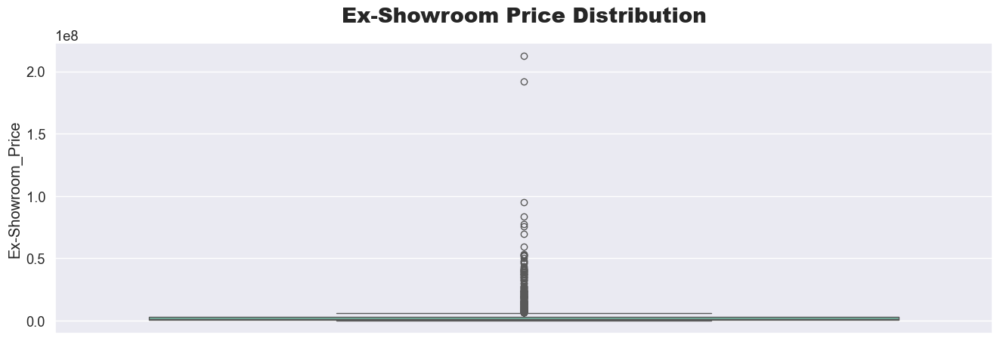

In [133]:
plt.figure(figsize=(16,5))
sns.boxplot(car["Ex-Showroom_Price"],palette="Set2")
plt.title("Ex-Showroom Price Distribution",fontweight="black",size=20,pad=20)
plt.show()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">1. Dropping Outliers</h1>

In [134]:
car[car["Ex-Showroom_Price"]>150000000][["Car Manufacturer","Car Model","Ex-Showroom_Price"]]

,Car Manufacturer,Car Model,Ex-Showroom_Price
355,Bugatti,Chiron,192142937
356,Bugatti,Chiron,212155397


In [135]:
car.drop([355,356],inplace=True)

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">2. Visualizing Avarage Price by Car_Manufacturer</h1>

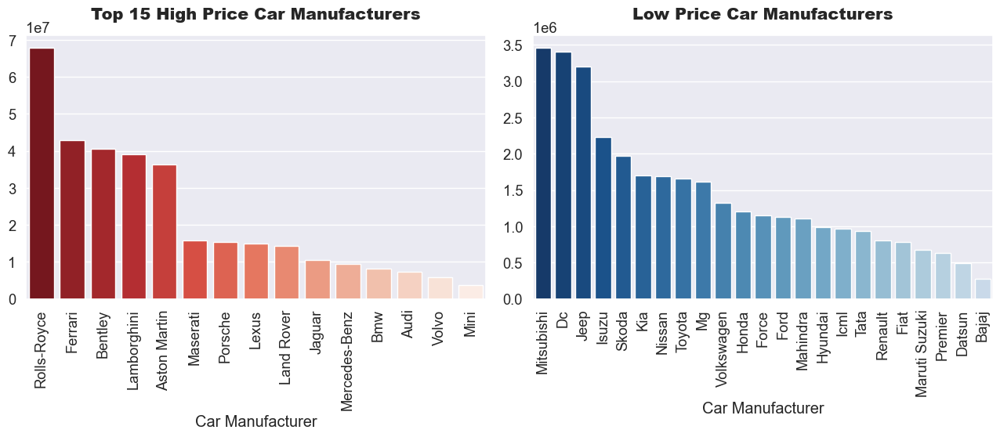

In [136]:
average_price1 = car.groupby(["Car Manufacturer"])["Ex-Showroom_Price"].mean().sort_values(ascending=False)[0:15]
average_price2 = car.groupby(["Car Manufacturer"])["Ex-Showroom_Price"].mean().sort_values(ascending=False)[15:]

plt.figure(figsize=(13,6))
plt.subplot(1,2,1)
sns.barplot(x=average_price1.index, y=average_price1.values, palette=sns.color_palette("Reds",15)[::-1])
plt.title("Top 15 High Price Car Manufacturers",fontweight="black",size=15, pad=15)

plt.xticks(rotation=90)

plt.subplot(1,2,2)
sns.barplot(x=average_price2.index, y=average_price2.values, palette=sns.color_palette("Blues",30)[::-1])
plt.title("Low Price Car Manufacturers",fontweight="black",size=15, pad=15)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">3. Visualizing Displacement,Power and Torque features</h1>

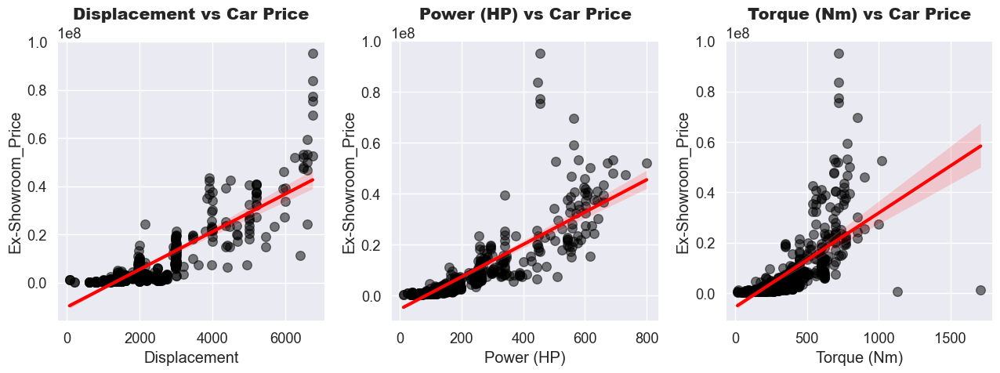

In [137]:
cols = ["Displacement","Power (HP)","Torque (Nm)"]


plt.figure(figsize=(13,5))
for index, column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.regplot(x=column, y="Ex-Showroom_Price", data=car, color="black", scatter_kws={'s': 70, 'alpha': 0.5}, 
                line_kws={'color': 'red', 'lw': 3})
    plt.title(f"{column} vs Car Price",pad=20,fontweight="black",size=15)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">4. Visualizing Height,Width and Length features</h1>

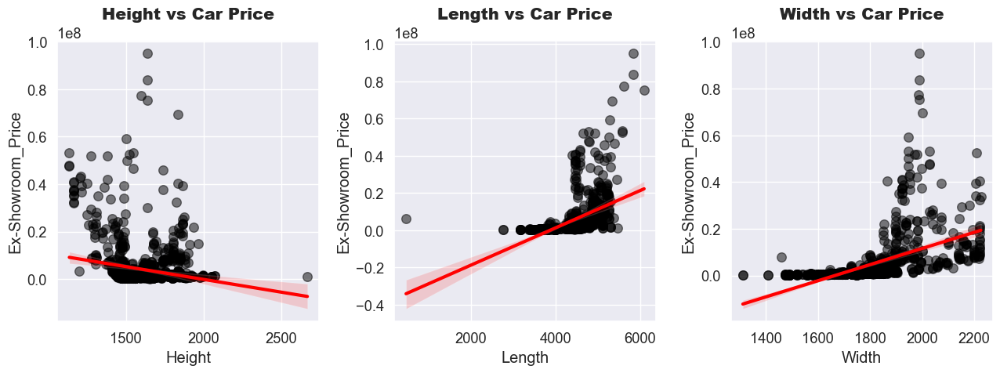

In [138]:
cols = ["Height","Length","Width"]


plt.figure(figsize=(13,5))
for index, column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.regplot(x=column, y="Ex-Showroom_Price", data=car, color="black", scatter_kws={'s': 70, 'alpha': 0.5}, 
                line_kws={'color': 'red', 'lw': 3})
    plt.title(f"{column} vs Car Price",pad=20,fontweight="black",size=15)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">5. Visualizing Weight,Wheekbase and Fuel_Tank_Capacity features</h1>

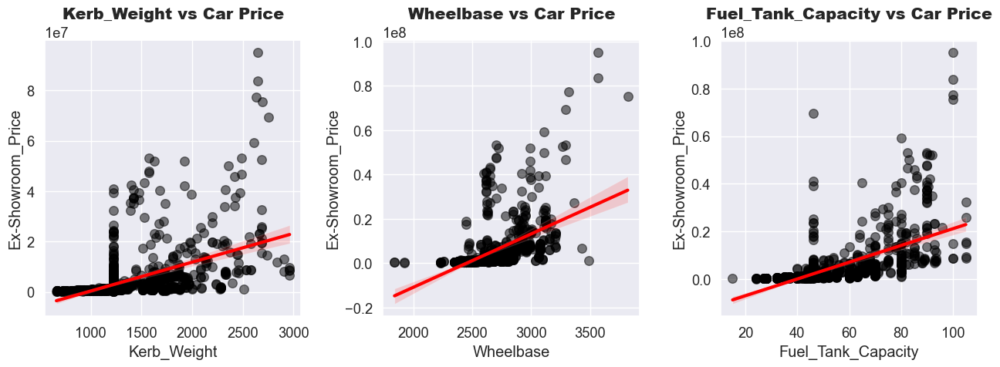

In [139]:
cols = ["Kerb_Weight","Wheelbase","Fuel_Tank_Capacity"]


plt.figure(figsize=(13,5))
for index, column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.regplot(x=column, y="Ex-Showroom_Price", data=car, color="black", scatter_kws={'s': 70, 'alpha': 0.5}, 
                line_kws={'color': 'red', 'lw': 3})
    plt.title(f"{column} vs Car Price",pad=20,fontweight="black",size=15)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">6. Visualizing Mileage,Ground_Clearance and Boot_Space features</h1>

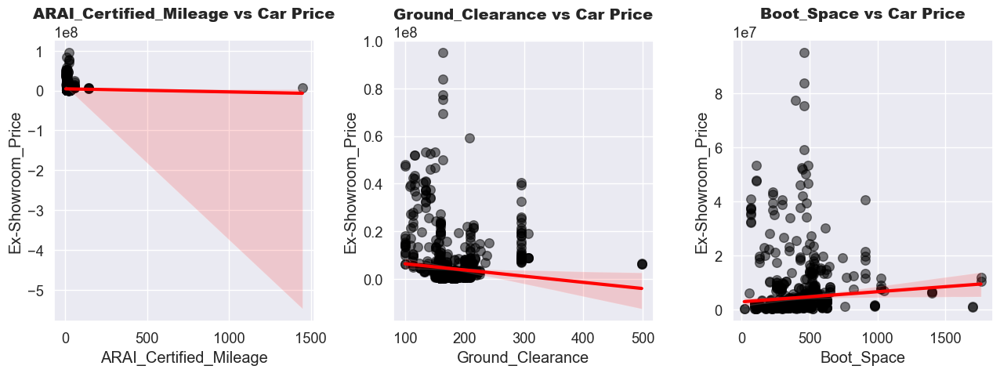

In [140]:
cols = ["ARAI_Certified_Mileage","Ground_Clearance","Boot_Space"]


plt.figure(figsize=(13,5))
for index, column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.regplot(x=column, y="Ex-Showroom_Price", data=car, color="black", scatter_kws={'s': 70, 'alpha': 0.5}, 
                line_kws={'color': 'red', 'lw': 3})
    plt.title(f"{column} vs Car Price",pad=20,fontweight="black",size=14)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">7. Visualizing Cylinders,Doors and Valves_Per_Cylinder features</h1>

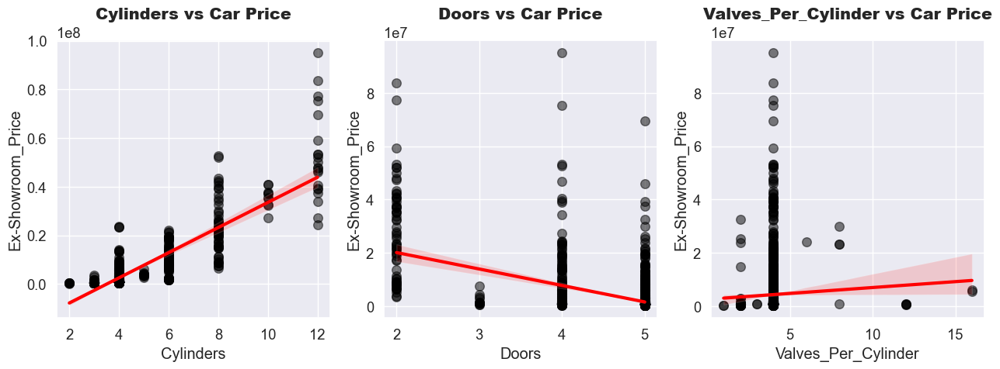

In [141]:
cols = ['Cylinders','Doors','Valves_Per_Cylinder']

plt.figure(figsize=(13,5))
for index, column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.regplot(x=column, y="Ex-Showroom_Price", data=car, color="black", scatter_kws={'s': 70, 'alpha': 0.5}, 
                line_kws={'color': 'red', 'lw': 3})
    plt.title(f"{column} vs Car Price",pad=20,fontweight="black",size=15)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">8. Visualizing Seating_Capacity and Number_of_Airbags features</h1>

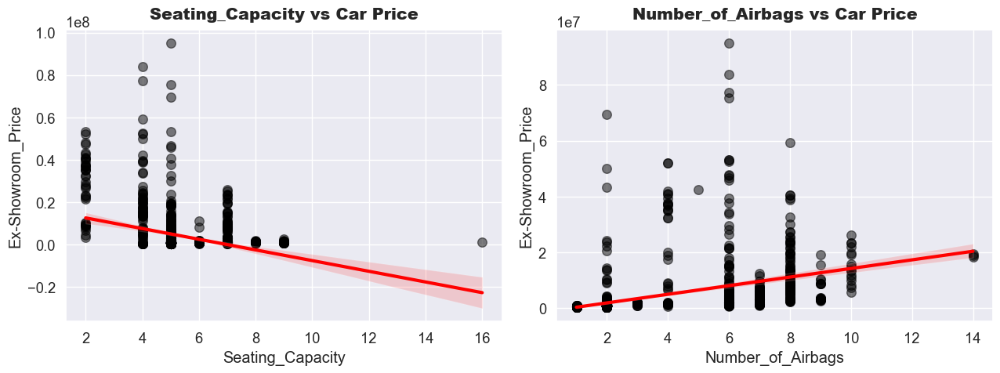

In [142]:
cols =['Seating_Capacity','Number_of_Airbags']

plt.figure(figsize=(13,5))
for index, column in enumerate(cols):
    plt.subplot(1,2,index+1)
    sns.regplot(x=column, y="Ex-Showroom_Price", data=car, color="black", scatter_kws={'s': 70, 'alpha': 0.5}, 
                line_kws={'color': 'red', 'lw': 3})
   
    plt.title(f"{column} vs Car Price",pad=10,fontweight="black",size=15)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">9. Visualizing Odometer, Speedometer, Tachometer and Tripmeter features</h1>

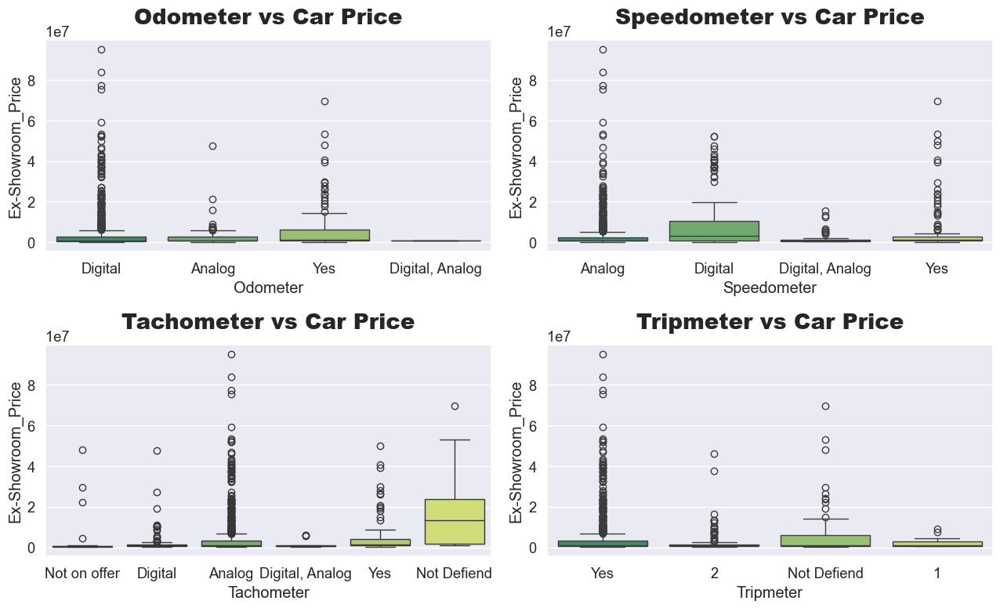

In [143]:
cols = ["Odometer","Speedometer","Tachometer","Tripmeter"]

plt.figure(figsize=(13,8))
for index,column in enumerate(cols):
    plt.subplot(2,2,index+1)
    sns.boxplot(x=car[column], y=car["Ex-Showroom_Price"],palette="summer")
    plt.title(f"{column} vs Car Price",fontweight="black",size=20,pad=15)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">10. Visualizing Fuel_Type, Power_Steering, Emission_Train and Drivetrain features</h1>

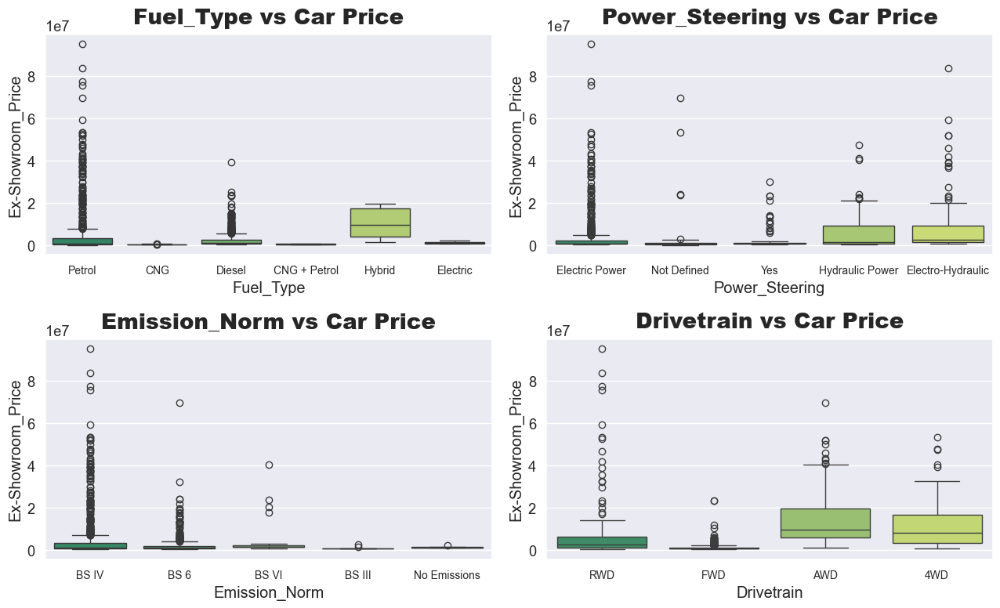

In [144]:
cols = ["Fuel_Type","Power_Steering","Emission_Norm","Drivetrain"]

plt.figure(figsize=(13,8))
for index,column in enumerate(cols):
    plt.subplot(2,2,index+1)
    sns.boxplot(x=car[column],y=car["Ex-Showroom_Price"],palette="summer")
    plt.title(f"{column} vs Car Price",fontweight="black",size=20,pad=10)
    plt.xticks(size=10)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">11. Visualizing Body_Type and Engine_Location features</h1>

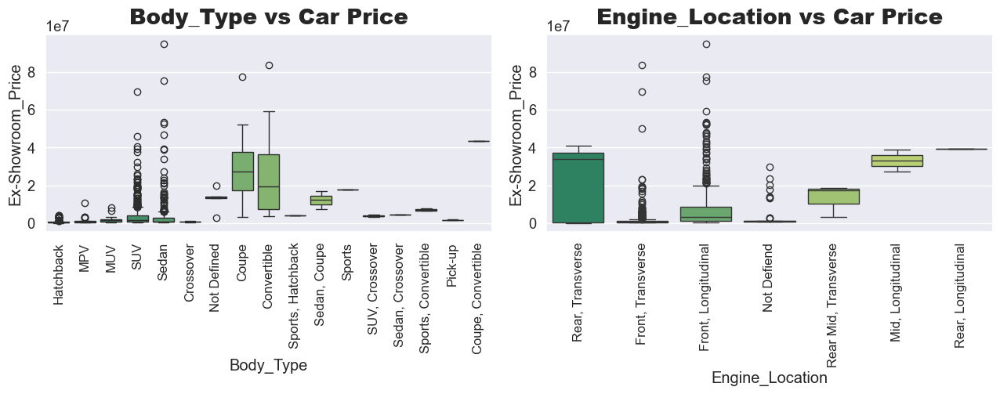

In [145]:
cols = ["Body_Type","Engine_Location"]

plt.figure(figsize=(13,8))
for index,column in enumerate(cols):
    plt.subplot(2,2,index+1)
    sns.boxplot(x=car[column], y=car["Ex-Showroom_Price"],palette="summer")
    plt.title(f"{column} vs Car Price",fontweight="black",size=20,pad=10)
    plt.xticks(size=12,rotation=90)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">12. Visualizing Cylinder_Configuration, Keyless_Entry and Seats_Material features</h1>

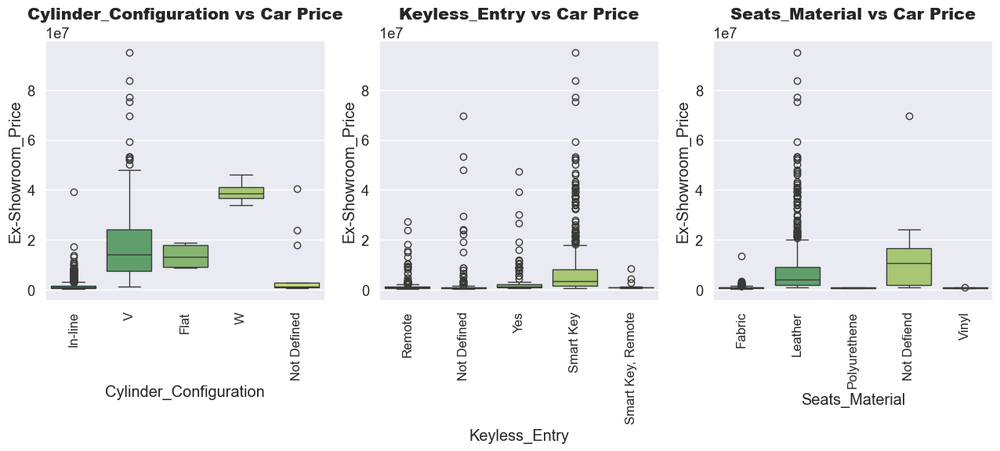

In [146]:
cols = ["Cylinder_Configuration","Keyless_Entry","Seats_Material"]

plt.figure(figsize=(13,6))
for index,column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.boxplot(x=car[column], y=car["Ex-Showroom_Price"],palette="summer")
    plt.title(f"{column} vs Car Price",fontweight="black",size=15,pad=20)
    plt.xticks(size=12,rotation=90)
    plt.tight_layout()

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">13. Visualizing Seat_Height_Adjustment, Adjustable_Steering and Parking_Assistance features</h1>

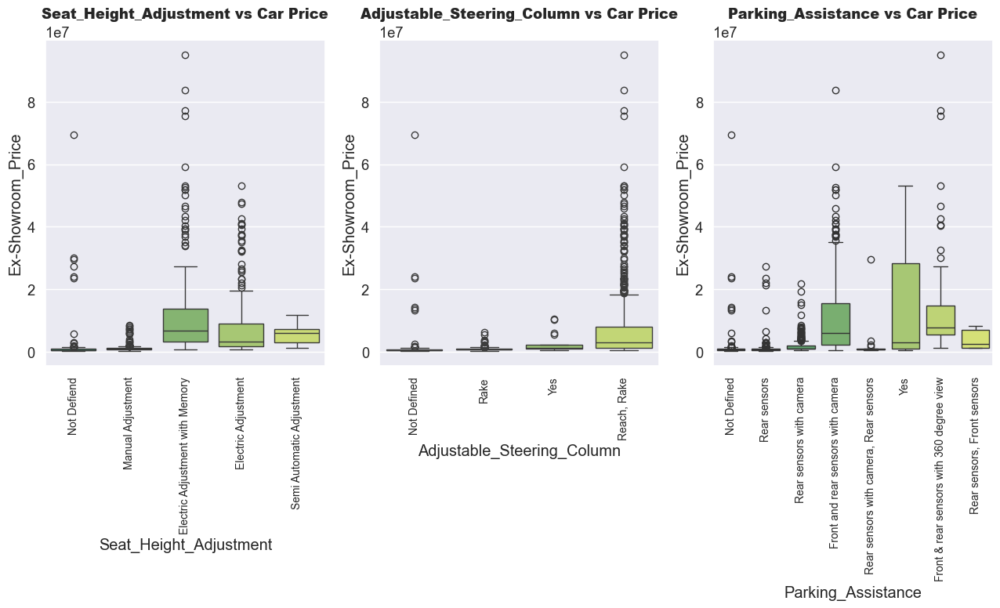

In [147]:
cols = ["Seat_Height_Adjustment","Adjustable_Steering_Column","Parking_Assistance"]

plt.figure(figsize=(13,8))
for index,column in enumerate(cols):
    plt.subplot(1,3,index+1)
    sns.boxplot(x=car[column], y=car["Ex-Showroom_Price"],palette="summer")
    plt.title(f"{column} vs Car Price",fontweight="black",size=13,pad=20)
    plt.xticks(rotation=90,size=10)
    plt.tight_layout()

<h1 style="color:red; font-size:36px; font-family:Arial, sans-serif; text-align:center;">Data Preprocessing</h1>

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">1. Performing Feature Selection on Binary Categorical Features</h1>

In [148]:
cols = ['Central_Locking','Child_Safety_Locks','Low_Fuel_Warning','Third_Row_AC_Vents','Second_Row_AC_Vents',
        'Auto-Dimming_Rear-View_Mirror','Engine_Immobilizer','ABS_(Anti-lock_Braking_System)',
        'EBD_(Electronic_Brake-force_Distribution)','Cooled_Glove_Box','EBA_(Electronic_Brake_Assist)',
        'ESP_(Electronic_Stability_Program)','Gear_Shift_Reminder','Key_Off_Reminder','USB_Compatibility',
        'Bluetooth','Navigation_System','Turbocharger',"Automatic_Headlamps","Cruise_Control"]

In [149]:
x = car[cols]
y = car["Ex-Showroom_Price"]

In [150]:
abc = LabelEncoder()
x[cols] = x[cols].apply(abc.fit_transform)

In [151]:
selector = SelectKBest(score_func=f_regression, k=5) 
selector.fit(x, y)

SelectKBest(k=5, score_func=<function f_regression at 0x000001D2E12D0360>)

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Visualizing the F-score of the these features</h1>

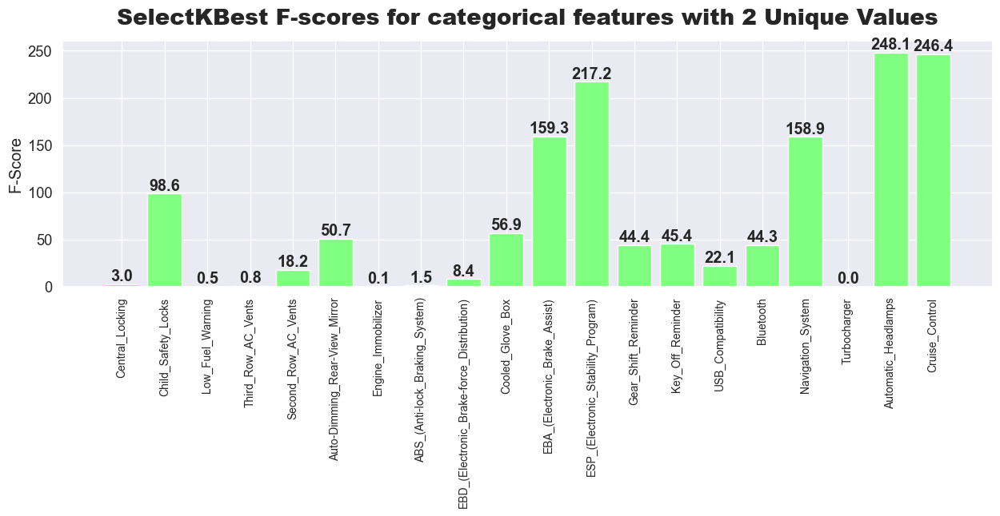

In [152]:
scores = selector.scores_
feature_names = x.columns

plt.figure(figsize=(15, 4))
plt.bar(feature_names,scores,color=(0.5, 1.0, 0.5))
for index,value in enumerate(scores):
    plt.text(index,value,round(value,1),ha="center",fontweight="bold",va="bottom")
plt.ylabel('F-Score')
plt.xticks(rotation=90,size=10)
plt.title('SelectKBest F-scores for categorical features with 2 Unique Values',pad=15,fontweight="black",size=20)
plt.show()

## Select Useful features from this 

In [153]:
useful_features_1 = x.columns[selector.get_support(indices=True)]
useful_features_1

Index(['EBA_(Electronic_Brake_Assist)', 'ESP_(Electronic_Stability_Program)',
       'Navigation_System', 'Automatic_Headlamps', 'Cruise_Control'],
      dtype='object')

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">2. Perforimg Feature Selection on Categorical Features having multiple categories</h1>

In [154]:
cols = ["Odometer","Speedometer","Tachometer","Tripmeter","Fuel_Type","Power_Steering","Emission_Norm","Drivetrain",
        "Body_Type","Engine_Location","Cylinder_Configuration","Keyless_Entry","Seats_Material",
        "Seat_Height_Adjustment","Adjustable_Steering_Column","Parking_Assistance"]

In [155]:
x = car[cols]
y = car["Ex-Showroom_Price"]

In [156]:
abc = LabelEncoder()
x[cols] = x[cols].apply(abc.fit_transform)

In [157]:
selector = SelectKBest(score_func = f_regression, k=5)
selector.fit(x,y)

SelectKBest(k=5, score_func=<function f_regression at 0x000001D2E12D0360>)

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Visualizing the F-Score of these features</h1>

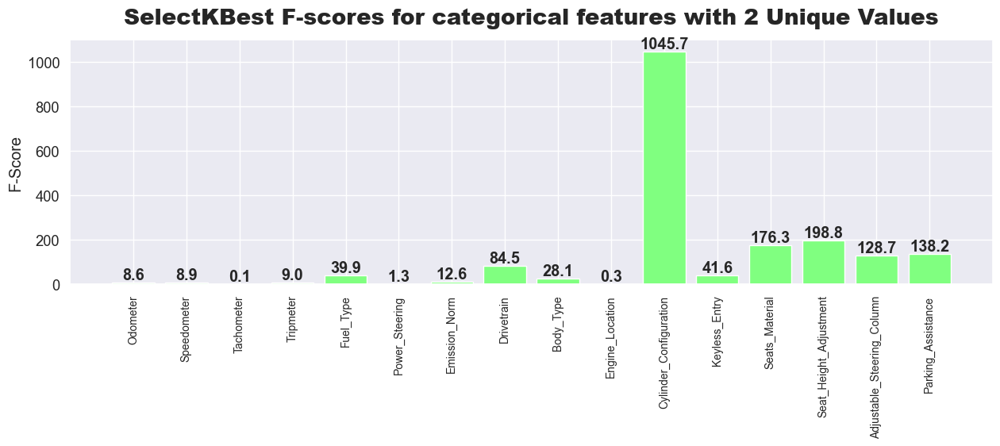

In [158]:
scores = selector.scores_
feature_names = x.columns

plt.figure(figsize=(15, 4))
plt.bar(feature_names,scores,color=(0.5, 1.0, 0.5))
for index,value in enumerate(scores):
    plt.text(index,value,round(value,1),ha="center",fontweight="bold",va="bottom")
plt.ylabel('F-Score')
plt.xticks(rotation=90,size=10)
plt.title('SelectKBest F-scores for categorical features with 2 Unique Values',pad=15,fontweight="black",size=20)
plt.show()

### Select USerful features form this 

In [159]:
useful_features_2 = x.columns[selector.get_support(indices=True)]
useful_features_2

Index(['Cylinder_Configuration', 'Seats_Material', 'Seat_Height_Adjustment',
       'Adjustable_Steering_Column', 'Parking_Assistance'],
      dtype='object')

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">3. Performing feature selection on Discrete Numerical features</h1>

In [160]:
cols = ['Cylinders','Doors','Valves_Per_Cylinder','Seating_Capacity','Number_of_Airbags']

In [161]:
x = car[cols]
y = car["Ex-Showroom_Price"]

In [162]:
selector = SelectKBest(score_func=f_regression,k=1)
selector.fit(x,y)

SelectKBest(k=1, score_func=<function f_regression at 0x000001D2E12D0360>)

<h1 style="color:green; font-size:25px; font-family:Arial, sans-serif; text-align:left;">Visualizing the F-Score of these features</h1>

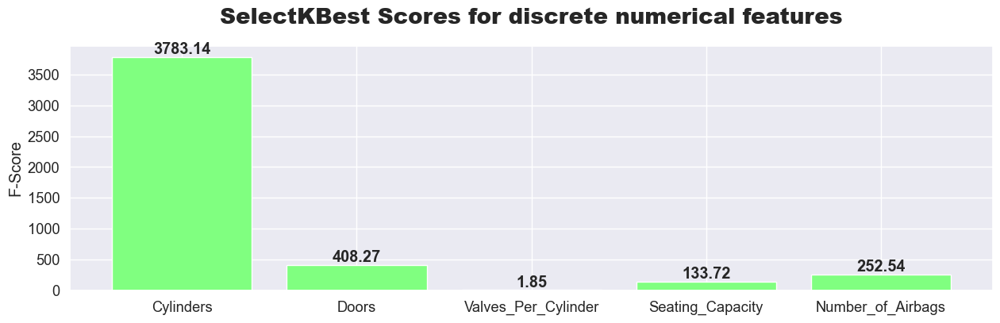

In [163]:
scores = selector.scores_
feature_names = x.columns

plt.figure(figsize=(15, 4))
plt.bar(feature_names, scores,color=(0.5, 1.0, 0.5))
for index,value in enumerate(scores):
    plt.text(index,value,round(value,2),ha="center",fontweight="bold",va="bottom")
plt.ylabel('F-Score')
plt.title('SelectKBest Scores for discrete numerical features',pad=20,fontweight="black",size=20)
plt.show()

### Selecting Best features from this

In [164]:
useful_features_3 = x.columns[selector.get_support(indices=True)]
useful_features_3

Index(['Cylinders'], dtype='object')

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">4. Performing feature selection on Continous Numerical features</h1>

In [165]:
cols = ["Displacement","Power (HP)","Torque (Nm)","Height","Length","Width","Kerb_Weight","Wheelbase","Fuel_Tank_Capacity",
        "ARAI_Certified_Mileage","Ground_Clearance","Boot_Space",'Ex-Showroom_Price']

In [166]:
new_car = car[cols]
corr = new_car.corr()["Ex-Showroom_Price"].to_frame().rename(columns={"Ex-Showroom_Price":"Correlation with Price"})

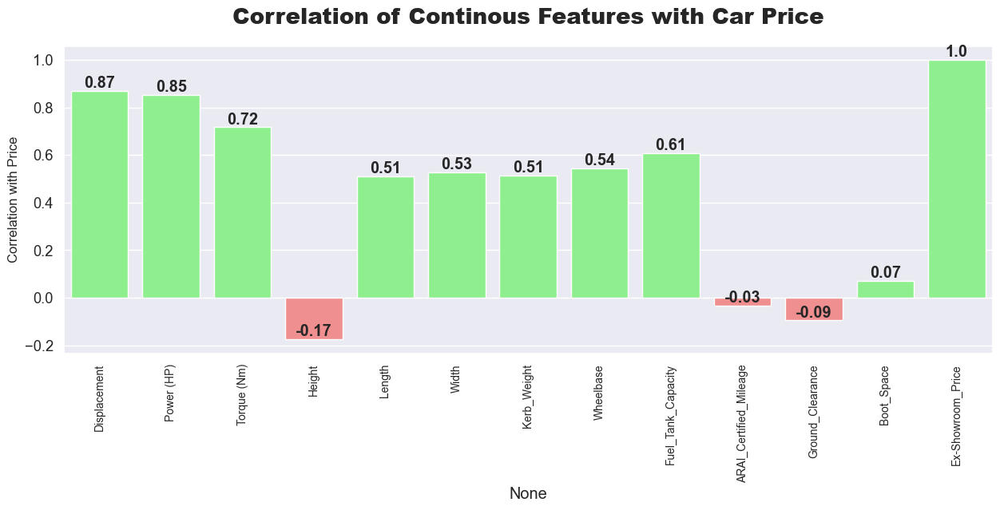

In [167]:
positive_color = (0.5, 1.0, 0.5)
negative_color = (1.0, 0.5, 0.5)
colors = [positive_color if c >= 0 else negative_color for c in corr["Correlation with Price"]]

plt.figure(figsize=(15,5))
ax = sns.barplot(x=corr.index,y=corr["Correlation with Price"],palette=colors)
for i, val in enumerate(corr["Correlation with Price"]):
    ax.text(i, val, round(val, 2), ha='center', va='bottom', fontweight='bold')
plt.title("Correlation of Continous Features with Car Price",fontweight="black",size=20,pad=20)
plt.ylabel("Correlation with Price",size=12)
plt.xticks(rotation=90,size=10)
plt.show()

### Selecting Useful features from this 

In [168]:
useful_features_4 = ["Displacement","Power (HP)","Torque (Nm)","Length","Width","Kerb_Weight","Wheelbase",
                    "Fuel_Tank_Capacity","ARAI_Certified_Mileage",'Ex-Showroom_Price']

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">5. Creating DataFrame with useful features</h1>

In [169]:
useful_cols = []
useful_cols.extend(useful_features_1.tolist())
useful_cols.extend(useful_features_2.tolist())
useful_cols.extend(useful_features_3.tolist())
useful_cols.extend(useful_features_4)

In [170]:
car = car[useful_cols]
car.sample(5)

,EBA_(Electronic_Brake_Assist),ESP_(Electronic_Stability_Program),Navigation_System,Automatic_Headlamps,Cruise_Control,Cylinder_Configuration,Seats_Material,Seat_Height_Adjustment,Adjustable_Steering_Column,Parking_Assistance,Cylinders,Displacement,Power (HP),Torque (Nm),Length,Width,Kerb_Weight,Wheelbase,Fuel_Tank_Capacity,ARAI_Certified_Mileage,Ex-Showroom_Price
1033,Yes,Yes,Yes,Yes,Yes,In-line,Leather,Electric Adjustment with Memory,"Reach, Rake",Rear sensors with camera,4.0,1950.0,194.66,400.0,4686.0,1810.0,1655.0,2840.0,66.0,12.06,4020000
206,Not Defiend,Not Defiend,Not Defiend,Not Defiend,Not Defiend,In-line,Fabric,Manual Adjustment,Rake,Not Defined,4.0,1496.0,88.77,132.0,3895.0,1735.0,950.0,2460.0,45.0,16.78,802000
1221,Not Defiend,Not Defiend,Not Defiend,Not Defiend,Not Defiend,In-line,Fabric,Manual Adjustment,Rake,Not Defined,4.0,1172.0,67.07,96.0,3989.0,1687.0,1095.0,2510.0,45.0,15.70,535562
331,Yes,Yes,Yes,Yes,Yes,V,Leather,Electric Adjustment with Memory,"Reach, Rake",Yes,8.0,4691.0,453.71,520.0,4881.0,1915.0,1880.0,2942.0,86.0,10.00,17229579
1134,Not Defiend,Not Defiend,Yes,Not Defiend,Not Defiend,In-line,Fabric,Manual Adjustment,Rake,Rear sensors,4.0,1591.0,121.32,151.0,4270.0,1780.0,1180.0,2590.0,55.0,15.29,1279983


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">6. Computing Skewness of Continous Numerical features</h1>

In [171]:
cols = ["Displacement","Power (HP)","Torque (Nm)","Length","Width","Kerb_Weight","Wheelbase",
        "Fuel_Tank_Capacity","ARAI_Certified_Mileage",'Ex-Showroom_Price']

In [172]:
car[cols].skew().to_frame().rename(columns={0:"Skewness"})

,Skewness
Displacement,2.475382
Power (HP),2.425332
Torque (Nm),1.722587
Length,-0.174612
Width,0.772992
Kerb_Weight,1.354881
Wheelbase,0.990579
Fuel_Tank_Capacity,1.009603
ARAI_Certified_Mileage,33.293933
Ex-Showroom_Price,4.529864


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">7. Visualizing which Transformation will have best fit for target variable</h1>

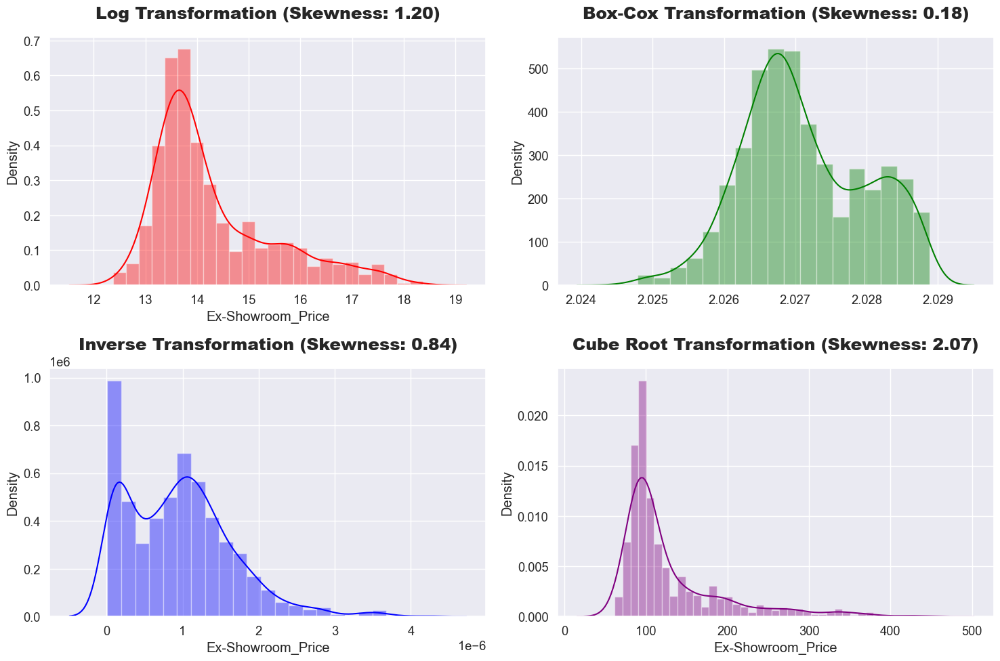

In [173]:
import numpy as np
import scipy.stats as stats

plt.figure(figsize=(15, 10))

# Log Transformation
transformed_log = np.log(car["Ex-Showroom_Price"])
skewness_log = stats.skew(transformed_log)
plt.subplot(2, 2, 1)
sns.distplot(transformed_log, kde=True, color="red")
plt.title(f"Log Transformation (Skewness: {skewness_log:.2f})", fontweight="black", size=18, pad=20)

# Box-Cox Transformation
transformed_boxcox, lambda_param = stats.boxcox(car["Ex-Showroom_Price"])
skewness_boxcox = stats.skew(transformed_boxcox)
plt.subplot(2, 2, 2)
sns.distplot(transformed_boxcox, kde=True, color="green")
plt.title(f"Box-Cox Transformation (Skewness: {skewness_boxcox:.2f})", fontweight="black", size=18, pad=20)

# Inverse Transformation
transformed_inverse = 1 / car["Ex-Showroom_Price"]
skewness_inverse = stats.skew(transformed_inverse)
plt.subplot(2, 2, 3)
sns.distplot(transformed_inverse, kde=True, color="blue")
plt.title(f"Inverse Transformation (Skewness: {skewness_inverse:.2f})", fontweight="black", size=18, pad=20)

# Cube Root Transformation
transformed_cbrt = np.cbrt(car["Ex-Showroom_Price"])
skewness_cbrt = stats.skew(transformed_cbrt)
plt.subplot(2, 2, 4)
sns.distplot(transformed_cbrt, kde=True, color="purple")
plt.title(f"Cube Root Transformation (Skewness: {skewness_cbrt:.2f})", fontweight="black", size=18, pad=20)

plt.tight_layout()
plt.show()

<h1 style="color:green; font-size:30px; font-family:Arial, sans-serif; text-align:left;">Apply Box-Cox Transformation</h1>

In [174]:
for column in cols:
    car[column], lamda_param = stats.boxcox(car[column])

In [175]:
car[cols].skew().to_frame().rename(columns={0:"Skewness"})

,Skewness
Displacement,-0.001349
Power (HP),-0.104279
Torque (Nm),0.000079
Length,0.126155
Width,0.000000
Kerb_Weight,-0.007802
Wheelbase,0.000000
Fuel_Tank_Capacity,0.000591
ARAI_Certified_Mileage,-0.243771
Ex-Showroom_Price,0.184044


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">8. Encoding Categorical features</h1>

In [176]:
cat_cols = car.select_dtypes(include=["object"]).columns

In [177]:
car = pd.get_dummies(car,columns=cat_cols)

In [178]:
car.sample(5)

,Cylinders,Displacement,Power (HP),Torque (Nm),Length,Width,Kerb_Weight,Wheelbase,Fuel_Tank_Capacity,ARAI_Certified_Mileage,Ex-Showroom_Price,EBA_(Electronic_Brake_Assist)_Not Defiend,EBA_(Electronic_Brake_Assist)_Yes,ESP_(Electronic_Stability_Program)_Not Defiend,ESP_(Electronic_Stability_Program)_Yes,Navigation_System_Not Defiend,Navigation_System_Yes,Automatic_Headlamps_Not Defiend,Automatic_Headlamps_Yes,Cruise_Control_Not Defiend,Cruise_Control_Yes,Cylinder_Configuration_Flat,Cylinder_Configuration_In-line,Cylinder_Configuration_Not Defined,Cylinder_Configuration_V,Cylinder_Configuration_W,Seats_Material_Fabric,Seats_Material_Leather,Seats_Material_Not Defiend,Seats_Material_Polyurethene,Seats_Material_Vinyl,Seat_Height_Adjustment_Electric Adjustment,Seat_Height_Adjustment_Electric Adjustment with Memory,Seat_Height_Adjustment_Manual Adjustment,Seat_Height_Adjustment_Not Defiend,Seat_Height_Adjustment_Semi Automatic Adjustment,Adjustable_Steering_Column_Not Defined,Adjustable_Steering_Column_Rake,"Adjustable_Steering_Column_Reach, Rake",Adjustable_Steering_Column_Yes,Parking_Assistance_Front & rear sensors with 360 degree view,Parking_Assistance_Front and rear sensors with camera,Parking_Assistance_Not Defined,Parking_Assistance_Rear sensors,Parking_Assistance_Rear sensors with camera,"Parking_Assistance_Rear sensors with camera, Rear sensors","Parking_Assistance_Rear sensors, Front sensors",Parking_Assistance_Yes
332,6.0,7.956186,2.255643,6.464589,77338.492034,0.771391,1.772977,0.604897,2.007384,1.677612,2.028581,False,True,False,True,False,True,False,True,False,True,False,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False
1036,8.0,8.240354,2.316821,6.622052,67480.797298,0.771388,1.771329,0.604896,1.997012,3.734837,2.028292,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False
671,4.0,7.644319,2.185204,5.854660,64229.439116,0.771389,1.771822,0.604896,2.007384,2.103133,2.027405,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,True,False,False,False
1142,4.0,7.779824,2.164635,5.823299,77993.300274,0.771388,1.773054,0.604897,1.927574,1.844985,2.027374,False,True,True,False,True,False,True,False,True,False,False,True,False,False,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False
692,4.0,7.644319,2.186089,6.050792,68093.823078,0.771390,1.775395,0.604896,1.979670,2.155929,2.027494,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,False


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">9. Segregating Features & Labels for Model Training</h1>

In [179]:
X = car.drop(columns="Ex-Showroom_Price")
y = car["Ex-Showroom_Price"]

In [180]:
X.shape

(1274, 47)

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">10. Scaling features using Robust Scaler</h1>

In [181]:
from sklearn.preprocessing import RobustScaler

In [182]:
scaler = RobustScaler()

In [183]:
x_scaled = scaler.fit_transform(X)

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">11. Splitting Data for Model Training & Testing</h1>

In [184]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled,y,test_size=0.2,random_state=0)

In [185]:
print("Dimension of x_train:=>",x_train.shape)
print("Dimension of x_test:=>",x_test.shape)
print("Dimension of y_train:=>",y_train.shape)
print("Dimension of y_test:=>",y_test.shape)

Dimension of x_train:=> (1019, 47)
Dimension of x_test:=> (255, 47)
Dimension of y_train:=> (1019,)
Dimension of y_test:=> (255,)


<h1 style="color:red; font-size:36px; font-family:Arial, sans-serif; text-align:center;">Model Creation and Evaluation</h1>

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">1. Creating a Function for Model Training and Model Evaluation</h1>

In [186]:
r2score = []
adj_r2_score = []
mae_score = []
mse_score = []
rmse_score = []
mpe_score = []
mape_score = []

In [187]:
def model_evaluation(model):
    model.fit(x_train, y_train)
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)
    n= len(y)
    k = X.shape[1]
    
    #Metric Calculation
    r2 = r2_score(y_test, y_test_pred)
    adj_r2 = 1 - ((1-r2)*(n-1)/(n-k-1))
    mae = mean_absolute_error(y_test,y_test_pred)
    mse = mean_squared_error(y_test,y_test_pred)
    rmse = np.sqrt(mse)
    mpe = np.mean((y_test - y_test_pred) / y_test) * 100
    mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
    
    #Appending Metric Value
    r2score.append(r2)
    adj_r2_score.append(adj_r2)
    mae_score.append(mae)
    mse_score.append(mse)
    rmse_score.append(rmse)
    mpe_score.append(mpe)
    mape_score.append(mape)
    
    #Returning Metric Value
    print("-"*127)
    print("R-squared:", r2)
    print("Adjusted R-Squared",adj_r2)
    print()
    print("Mean Absolute Error (MAE):", mae)
    print("Mean Squared Error (MSE):", mse)
    print("Root Mean Squared Error (RMSE):", rmse)
    print("Mean Percentage Error (MPE):", mpe)
    print("Mean Absolute Percentage Error (MAPE):", mape)
    print("-"*127)
    
    #Scatter plot
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(y_train, y_train_pred, color='blue', label='Train')
    plt.scatter(y_test, y_test_pred, color='red', label='Test')
    plt.xlabel('True values')
    plt.ylabel('Predicted values')
    plt.legend()
    plt.title('Scatter Plot', fontweight="black", size=20, pad=10)
    
    # Residual plot
    plt.subplot(1, 2, 2)
    plt.scatter(y_train_pred, y_train_pred - y_train, color='blue', label='Train')
    plt.scatter(y_test_pred, y_test_pred - y_test, color='red', label='Test')
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel('Predicted values')
    plt.ylabel('Residuals')
    plt.legend()
    plt.title('Residual Plot', fontweight="black", size=20, pad=10)

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">1. Linear Regression Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.951870936998246
Adjusted R-Squared 0.9500258587265638

Mean Absolute Error (MAE): 0.00014409668968568665
Mean Squared Error (MSE): 3.6158730628429625e-08
Root Mean Squared Error (RMSE): 0.00019015449147582507
Mean Percentage Error (MPE): -0.000738722545219576
Mean Absolute Percentage Error (MAPE): 0.0071083350900360345
-------------------------------------------------------------------------------------------------------------------------------


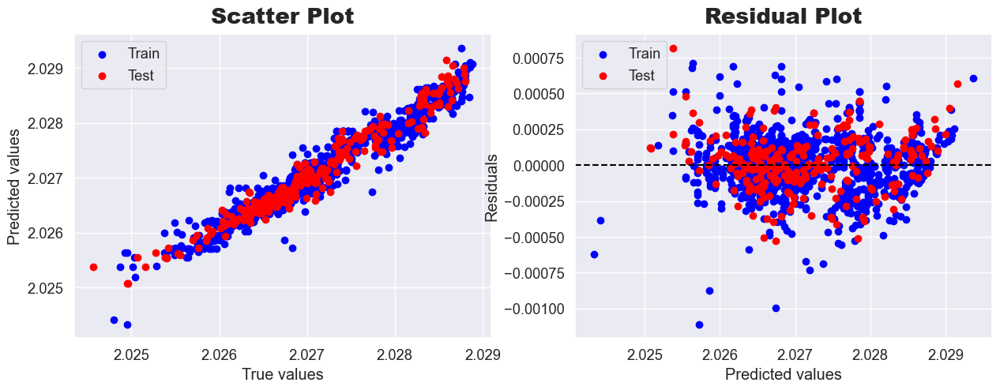

In [188]:
model_evaluation(LinearRegression())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">2. RidgeCV Regression Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9521561166091224
Adjusted R-Squared 0.9503219709978897

Mean Absolute Error (MAE): 0.0001439943700283681
Mean Squared Error (MSE): 3.594447894582319e-08
Root Mean Squared Error (RMSE): 0.00018959029233012745
Mean Percentage Error (MPE): -0.0007192971827045648
Mean Absolute Percentage Error (MAPE): 0.007103306037627203
-------------------------------------------------------------------------------------------------------------------------------


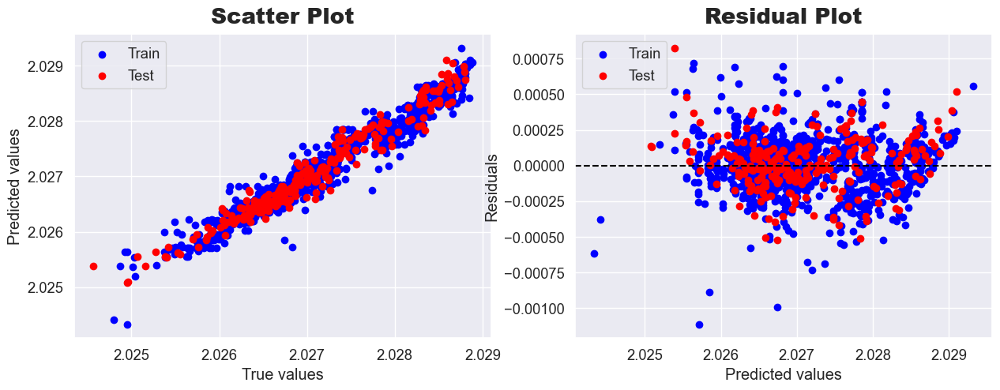

In [189]:
model_evaluation(RidgeCV())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">3. LassoCV Regression Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9533183578048356
Adjusted R-Squared 0.9515287679327535

Mean Absolute Error (MAE): 0.00014219406765580368
Mean Squared Error (MSE): 3.5071302455361935e-08
Root Mean Squared Error (RMSE): 0.00018727333621036907
Mean Percentage Error (MPE): -0.0006857571211681132
Mean Absolute Percentage Error (MAPE): 0.007014568558896986
-------------------------------------------------------------------------------------------------------------------------------


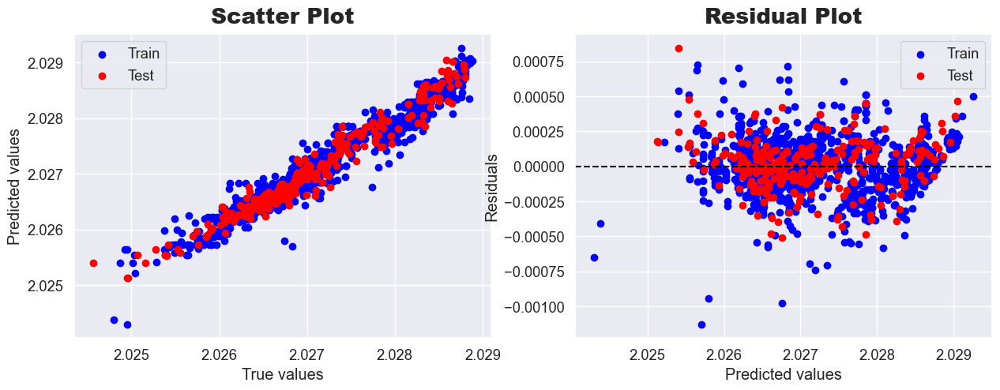

In [190]:
model_evaluation(LassoCV())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">4. ElasticNetCV Regression Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9533181272491906
Adjusted R-Squared 0.9515285285385152

Mean Absolute Error (MAE): 0.00014219444237960251
Mean Squared Error (MSE): 3.5071475668779005e-08
Root Mean Squared Error (RMSE): 0.00018727379867130106
Mean Percentage Error (MPE): -0.0006857599458212766
Mean Absolute Percentage Error (MAPE): 0.007014587050920222
-------------------------------------------------------------------------------------------------------------------------------


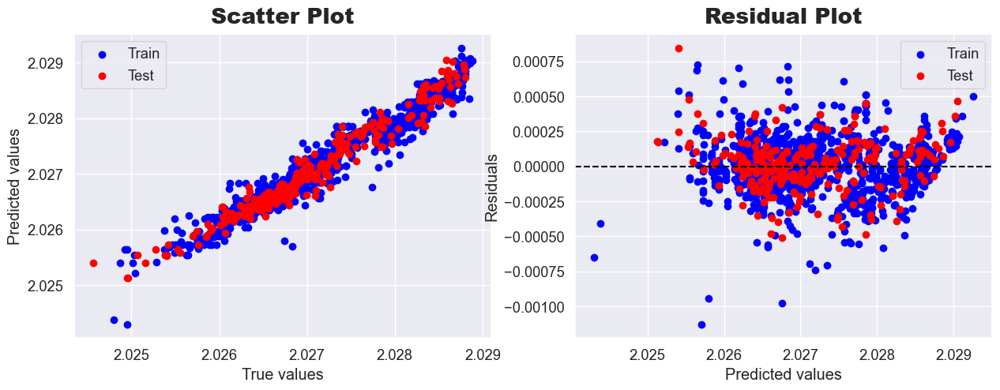

In [191]:
model_evaluation(ElasticNetCV())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">5. DecisionTree Regressor Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9634096377828615
Adjusted R-Squared 0.9620069077468048

Mean Absolute Error (MAE): 0.0001057063544240452
Mean Squared Error (MSE): 2.7489856824305204e-08
Root Mean Squared Error (RMSE): 0.00016580065387176616
Mean Percentage Error (MPE): 0.0004273060648527001
Mean Absolute Percentage Error (MAPE): 0.005215161032679948
-------------------------------------------------------------------------------------------------------------------------------


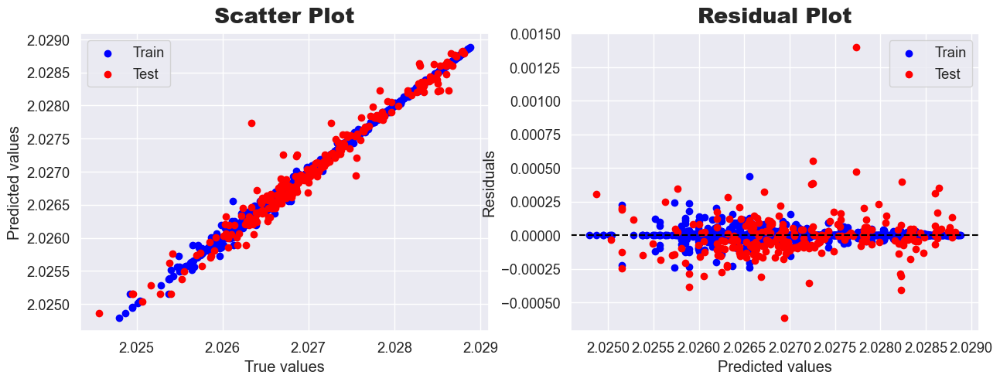

In [192]:
model_evaluation(DecisionTreeRegressor())


<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">6. RandomForest Regressor Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9765615181174345
Adjusted R-Squared 0.9756629792524422

Mean Absolute Error (MAE): 9.287786045262171e-05
Mean Squared Error (MSE): 1.7609022488140438e-08
Root Mean Squared Error (RMSE): 0.0001326989920389015
Mean Percentage Error (MPE): 0.000272550736676816
Mean Absolute Percentage Error (MAPE): 0.0045823533544544996
-------------------------------------------------------------------------------------------------------------------------------


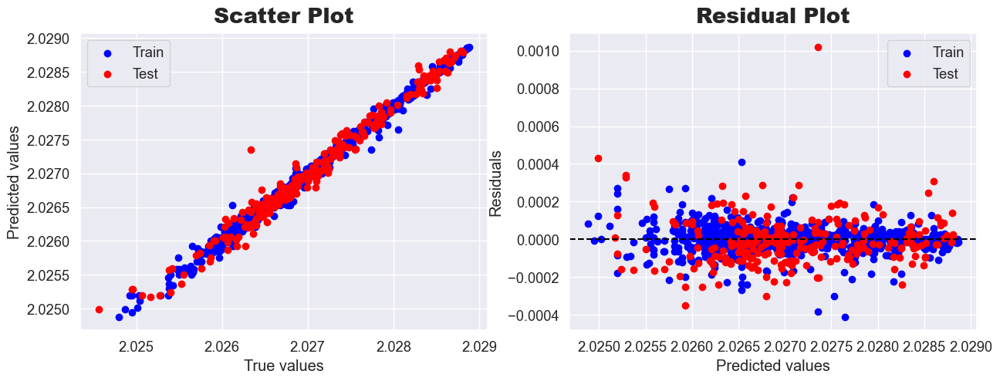

In [193]:
model_evaluation(RandomForestRegressor())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">7. Gradient Boosting Regressor Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9765166050679117
Adjusted R-Squared 0.9756163444139083

Mean Absolute Error (MAE): 9.917881188462967e-05
Mean Squared Error (MSE): 1.7642765070233404e-08
Root Mean Squared Error (RMSE): 0.00013282607074755092
Mean Percentage Error (MPE): 6.679912964348702e-05
Mean Absolute Percentage Error (MAPE): 0.004892962434998002
-------------------------------------------------------------------------------------------------------------------------------


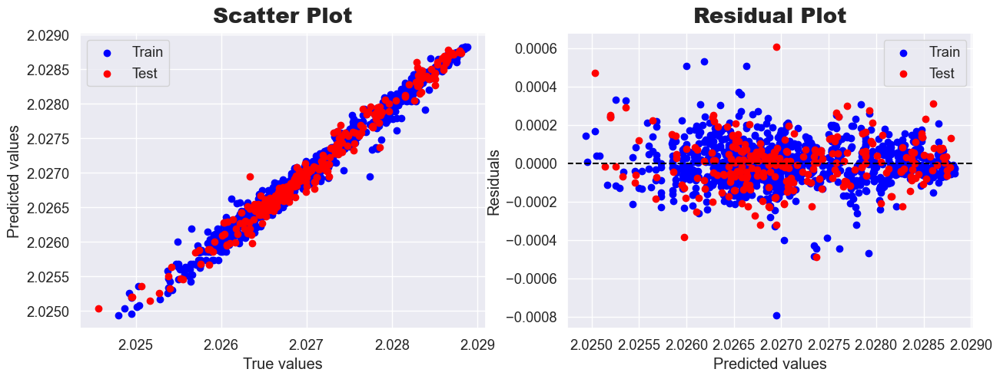

In [194]:
model_evaluation(GradientBoostingRegressor())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">8. Ada Boost Regressor Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9488411048837632
Adjusted R-Squared 0.9468798748099759

Mean Absolute Error (MAE): 0.000149227788211319
Mean Squared Error (MSE): 3.84350035588409e-08
Root Mean Squared Error (RMSE): 0.0001960484724726028
Mean Percentage Error (MPE): 0.0008094739825894852
Mean Absolute Percentage Error (MAPE): 0.007362076102895505
-------------------------------------------------------------------------------------------------------------------------------


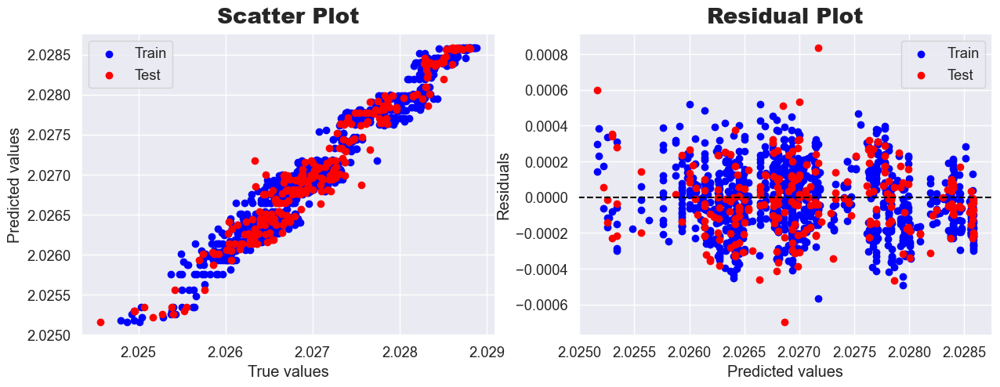

In [195]:
model_evaluation(AdaBoostRegressor())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">9. XGB Regressor Model</h1>

-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9642786943140389
Adjusted R-Squared 0.9629092804745282

Mean Absolute Error (MAE): 0.00011935876300280398
Mean Squared Error (MSE): 2.6836946107747577e-08
Root Mean Squared Error (RMSE): 0.00016381985870994877
Mean Percentage Error (MPE): -0.00020341429793341697
Mean Absolute Percentage Error (MAPE): 0.0058885839087781605
-------------------------------------------------------------------------------------------------------------------------------


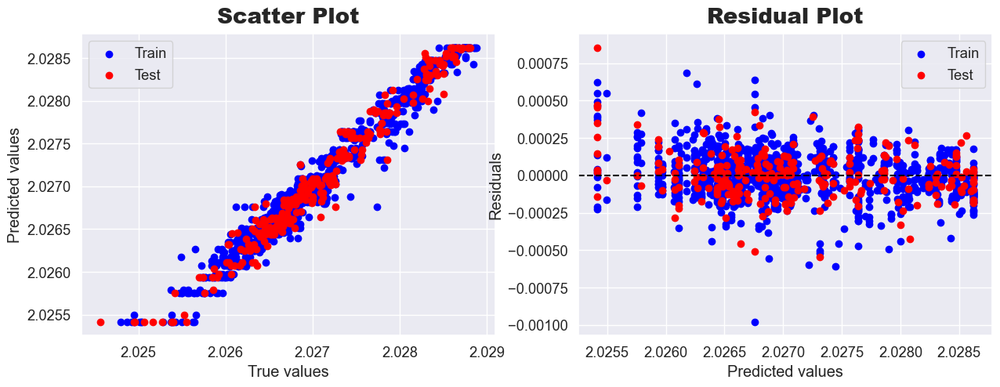

In [196]:
model_evaluation(XGBRegressor())

<h1 style="color:blue; font-size:25px; font-family:Arial, sans-serif; text-align:left;">10. LGBM Regressor Model</h1>

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1193
[LightGBM] [Info] Number of data points in the train set: 1019, number of used features: 36
[LightGBM] [Info] Start training from score 2.027121
-------------------------------------------------------------------------------------------------------------------------------
R-squared: 0.9788276664194584
Adjusted R-Squared 0.9780160027340706

Mean Absolute Error (MAE): 8.98817112047889e-05
Mean Squared Error (MSE): 1.5906495139665545e-08
Root Mean Squared Error (RMSE): 0.0001261209544035627
Mean Percentage Error (MPE): 0.0001694079265138611
Mean Absolute Percentage Error (MAPE): 0.004434650685109126
-------------------------------------------------------------------------------------------------------------------------------


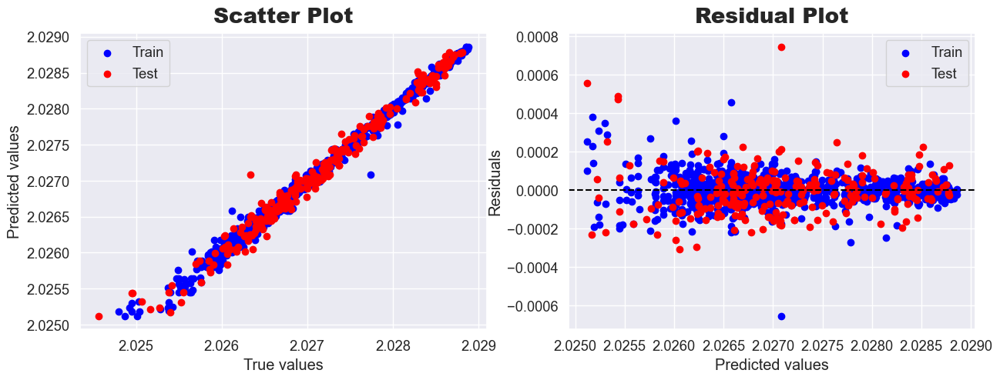

In [197]:
model_evaluation(LGBMRegressor())

<h1 style="color:red; font-size:36px; font-family:Arial, sans-serif; text-align:center;">ALL MODEL PERFORMANCE COMPARISONS</h1>

In [198]:
algos = ["Linear Regression","RidgeCV Regression","LassoCV Regression","ElasticNet Regression","DecisionTree Regressor",
         "RandomForest Regressor","GradientBoosting Regressor","AdaBoost Regressor","XGBoost Regressor","LGBM Regressor"]

In [199]:
performance = pd.DataFrame({"Model":algos,"R2_Score":r2score,"Adjusted_R2":adj_r2_score,"MAE":mae_score,
                           "MSE":mse_score,"RMSE":rmse_score,"MPE":mpe_score,"MAPE":mape_score})

In [200]:
performance

,Model,R2_Score,Adjusted_R2,MAE,MSE,RMSE,MPE,MAPE
0,Linear Regression,0.951871,0.950026,0.000144,3.615873e-08,0.000190,-0.000739,0.007108
1,RidgeCV Regression,0.952156,0.950322,0.000144,3.594448e-08,0.000190,-0.000719,0.007103
2,LassoCV Regression,0.953318,0.951529,0.000142,3.507130e-08,0.000187,-0.000686,0.007015
3,ElasticNet Regression,0.953318,0.951529,0.000142,3.507148e-08,0.000187,-0.000686,0.007015
4,DecisionTree Regressor,0.963410,0.962007,0.000106,2.748986e-08,0.000166,0.000427,0.005215
5,RandomForest Regressor,0.976562,0.975663,0.000093,1.760902e-08,0.000133,0.000273,0.004582
6,GradientBoosting Regressor,0.976517,0.975616,0.000099,1.764277e-08,0.000133,0.000067,0.004893
7,AdaBoost Regressor,0.948841,0.946880,0.000149,3.843500e-08,0.000196,0.000809,0.007362
8,XGBoost Regressor,0.964279,0.962909,0.000119,2.683695e-08,0.000164,-0.000203,0.005889
9,LGBM Regressor,0.978828,0.978016,0.000090,1.590650e-08,0.000126,0.000169,0.004435


<h1 style="color:red; font-size:36px; font-family:Arial, sans-serif; text-align:center;">Conclusion</h1>

#### Objective Achievement:

The project successfully achieved its goal of predicting a car's ex-showroom price using relevant features.

#### Comprehensive Process:

The journey involved extensive Data Cleaning, Data Preprocessing, Feature Selection, Model Training, and Evaluation.

#### Model Performance:

A robust machine learning model demonstrated strong predictive performance after training on a cleaned and standardized dataset.

#### Data Quality Emphasis:

The importance of proper data cleaning and preprocessing techniques was highlighted, addressing issues like missing values and outliers.

#### Feature Selection Impact:

Out of 140 car attributes, the model was trained on the best-selected features, showcasing the significance of careful feature selection.

#### Accuracy and Reliability:

The project's success, reflected in high accuracy and low metric scores, underscores the effectiveness of the solution.

#### Practical Applicability:

The developed model has practical applicability, proving its potential for deployment in scenarios where accurate car price predictions are crucial.